# Rainfall Weather Forecasting
Project Description
Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:
 
1. Problem Statement: 
a) Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.
b)  Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.


Dataset Description:
Number of columns: 23


Date  - The date of observation
Location  -The common name of the location of the weather station
MinTemp  -The minimum temperature in degrees celsius
MaxTemp -The maximum temperature in degrees celsius
Rainfall  -The amount of rainfall recorded for the day in mm
Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
Sunshine  -The number of hours of bright sunshine in the day.
WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
WindDir9am -Direction of the wind at 9am
WindDir3pm -Direction of the wind at 3pm
WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
Humidity9am -Humidity (percent) at 9am
Humidity3pm -Humidity (percent) at 3pm
Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
Cloud9am - Fraction of sky obscured by cloud at 9am. 
Cloud3pm -Fraction of sky obscured by cloud 
Temp9am-Temperature (degrees C) at 9am
Temp3pm -Temperature (degrees C) at 3pm
RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".


In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

# LET'S IMPORT OUR DATASET

In [2]:
rain_forecast=pd.read_csv(r"https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
rain_forecast

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
pd.set_option("display.max_column",None)
rain_forecast

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [4]:
rain_forecast

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [5]:
rain_forecast.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [6]:
rain_forecast.shape

(8425, 23)

AS WE CAN SEE THAT THERE ARE ALMOST 23 COLUMNS AND 8425 ROWS IN THE DATASET WHICH IS KIND OF BIG DATASET

In [7]:
rain_forecast["RainTomorrow"].value_counts()

No     6195
Yes    1991
Name: RainTomorrow, dtype: int64

AS YOU CAN SEE THE COUNTS THAT TARGET VARIABLE HAVE MAINLY CONTAIN THE DATASET WITH NO ELMENTS MORE COMPARE TO YES VARIABLE

In [8]:
rain_forecast.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

AS WE CAN SEE THAT THERE ARE MANY VALUES PRESENT IN THE DATASET SO WE HAVE TO REMOVE THAT FROM OUR DFATASET BY USING DIFFERENT IMPUTATION TECHNIQUE

In [9]:
# LET'S FIX THE NULL VALUES OF THE DATASET
null_column1=["MinTemp","MaxTemp","Evaporation","Sunshine","WindGustSpeed","WindSpeed9am","WindSpeed3pm","Humidity9am","Humidity3pm","Pressure9am","Pressure3pm","Cloud9am","Cloud3pm","Temp9am","Temp3pm"]
for i in null_column1:
    rain_forecast[i]=rain_forecast[i].fillna(rain_forecast[i].mean())

In [10]:
rain_forecast.isnull().sum()

Date               0
Location           0
MinTemp            0
MaxTemp            0
Rainfall         240
Evaporation        0
Sunshine           0
WindGustDir      991
WindGustSpeed      0
WindDir9am       829
WindDir3pm       308
WindSpeed9am       0
WindSpeed3pm       0
Humidity9am        0
Humidity3pm        0
Pressure9am        0
Pressure3pm        0
Cloud9am           0
Cloud3pm           0
Temp9am            0
Temp3pm            0
RainToday        240
RainTomorrow     239
dtype: int64

AS WE CAN CLEALRY SEE THAT WE HAVE REMOVED THE NULL VALUES PRESENT IN THE FEATURE OF THE DATASET SO NOW IT IS CLEAN FEW MORE ARE LEFT FOR THEM WE HAVE TO USE MODE IMPUTATION TO REMOVE THAT NULL VALUES 

In [11]:
# LET'S REMOVE THE NULL VALUES FROM THE CATEGORICAL COLUMNS 
null_column2=["Rainfall","WindGustDir","WindDir9am","WindDir3pm","RainToday","RainTomorrow"]
for j in null_column2:
    rain_forecast[j]=rain_forecast[j].fillna(rain_forecast[j].mode()[0])

In [12]:
rain_forecast.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

AS WE CAN CLEALRY SEE THAT WE HAVE REMOVED THE NULL VALUES FROM OUR DATASET THERE IS NO NULL VALUES PRESEN AND OUR DATSET IS CLEAN 

In [13]:
rain_forecast

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No


In [14]:
rain_forecast.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   Evaporation    8425 non-null   float64
 6   Sunshine       8425 non-null   float64
 7   WindGustDir    8425 non-null   object 
 8   WindGustSpeed  8425 non-null   float64
 9   WindDir9am     8425 non-null   object 
 10  WindDir3pm     8425 non-null   object 
 11  WindSpeed9am   8425 non-null   float64
 12  WindSpeed3pm   8425 non-null   float64
 13  Humidity9am    8425 non-null   float64
 14  Humidity3pm    8425 non-null   float64
 15  Pressure9am    8425 non-null   float64
 16  Pressure3pm    8425 non-null   float64
 17  Cloud9am       8425 non-null   float64
 18  Cloud3pm

AS WE CAN SEE THAT OUR FEATURE VARIABLE DATE HAVE OBJEXT DATA TYPES WHICH NOT CORRECT WE HAVE TO FIX TO DATE TIME FORMAT 

In [15]:
# LET'S CHANGE IT
rain_forecast["Date"]= pd.to_datetime(rain_forecast["Date"])

In [16]:
rain_forecast.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

AS WECAN SEE THAT WE HAVE CHANGE THE OBJECT DATATYPE TO DATETIME64[NS] DATATYPE NOW LET'S BREAK THE DATE TIMEINTO NUMERICAL FEATURE 

In [17]:
# LET' CONVERT DATE INTO YEAR, MONTH , DAY 
rain_forecast["Day"]= pd.to_datetime(rain_forecast.Date,format= "%d%m%Y").dt.day

rain_forecast["Month"]= pd.to_datetime(rain_forecast.Date,format="%d%m%Y").dt.month

rain_forecast["Year"]= pd.to_datetime(rain_forecast.Date,format="%d%m%Y").dt.year

AS WECAN SEE WE HAVE CONVERTED THE DATE INTO YEAR , MONHT , DAY NOW WE HAVE TO DROP THE DATE COLUMN FROM HT DATASET

In [18]:
rain_forecast.drop("Date",axis=1,inplace=True)

In [19]:
rain_forecast

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


AS WE CAN SEE WE HAVE CREATED THE YEAR , MONHT , DAY COLUMN AS OUR ROW HAS INCREASED FROM 22 TO 25 

In [20]:
rain_forecast.nunique()

Location          12
MinTemp          286
MaxTemp          332
Rainfall         250
Evaporation      117
Sunshine         141
WindGustDir       16
WindGustSpeed     53
WindDir9am        16
WindDir3pm        16
WindSpeed9am      35
WindSpeed3pm      36
Humidity9am       91
Humidity3pm       95
Pressure9am      385
Pressure3pm      375
Cloud9am          10
Cloud3pm          10
Temp9am          305
Temp3pm          329
RainToday          2
RainTomorrow       2
Day               31
Month             12
Year              10
dtype: int64

In [21]:
# NOW LET'S CHECK VALUE COUNT FOR FEATURES
for i in rain_forecast.columns:
    print(rain_forecast[i].value_counts())
    print("************************************")

Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
************************************
 13.193305    75
 12.000000    74
 13.200000    71
 13.800000    69
 12.700000    68
              ..
-1.100000      1
 1.400000      1
-1.400000      1
-1.700000      1
 26.000000     1
Name: MinTemp, Length: 286, dtype: int64
************************************
19.0    87
23.8    75
19.8    74
25.0    71
22.3    68
        ..
8.2      1
10.3     1
39.7     1
9.4      1
43.5     1
Name: MaxTemp, Length: 332, dtype: int64
************************************
0.0      5539
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: Rainfall, Length: 250, dtype: int64
**********************

1. AS WE CAN CLEALRY SEE THAT THERE ARE ALMOST 12 LOCATION IN THE DATASET ANDD MOST OF THENM FROM MELBOURNE AND LEAST FROM ULURU

2. AS WE CAN SEE THAT MIN_TEMP RECORDED WAS ALMOST 1 AND AND IN MIN_TEMP RECORD WAS 87

In [22]:
# LET'S CHECK SOME RELATION BETWEEN THE FEATURES USING CROSS TAB
realt1=pd.crosstab(rain_forecast["RainTomorrow"],rain_forecast["Location"])
realt1

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
RainTomorrow,,,,,,,,,,,,
No,160,708,444,425,218,1216,624,366,962,39,924,348
Yes,45,199,135,186,32,406,198,116,242,0,306,126


In [23]:
AS WE CAN CLEARY SEE THAT 

SyntaxError: invalid syntax (2764706783.py, line 1)

In [24]:
realt2=pd.crosstab(rain_forecast["RainToday"],rain_forecast["Location"])
realt2

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
RainToday,,,,,,,,,,,,
No,161,708,444,424,217,1218,624,366,962,39,924,348
Yes,44,199,135,187,33,404,198,116,242,0,306,126


In [25]:
realt3=pd.crosstab(rain_forecast["Rainfall"],rain_forecast["Location"])
realt3

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
Rainfall,,,,,,,,,,,,
0.0,145,616,382,375,206,1044,477,290,876,38,792,298
0.1,0,0,0,0,0,0,28,0,0,0,0,0
0.2,5,45,40,19,2,84,46,53,26,0,74,12
0.4,6,19,12,16,2,36,22,9,24,1,16,14
0.5,0,0,0,0,0,0,7,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
142.2,0,0,0,0,1,0,0,0,0,0,0,0
168.4,0,0,1,0,0,0,0,0,0,0,0,0
225.0,0,0,0,0,0,0,0,0,0,0,2,0


In [26]:
realt4=pd.crosstab(rain_forecast["WindGustSpeed"],rain_forecast["Location"])
realt4

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
WindGustSpeed,,,,,,,,,,,,
7.000000,0,0,0,0,0,0,0,2,0,0,0,0
9.000000,0,0,0,0,0,0,0,6,0,0,0,0
11.000000,0,7,0,0,0,0,0,11,0,0,0,0
13.000000,0,29,7,0,0,0,0,21,0,0,0,0
15.000000,0,28,14,0,0,2,0,14,0,0,0,0
17.000000,1,34,31,5,0,2,0,13,0,0,6,0
19.000000,0,28,38,9,0,18,0,19,2,1,16,6
20.000000,4,47,62,11,0,18,0,24,6,0,10,4
22.000000,6,43,67,19,0,16,0,32,10,2,24,4


In [27]:
realt5=pd.crosstab(rain_forecast["Year"],rain_forecast["Location"])
realt5

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
Year,,,,,,,,,,,,
2008,0,31,0,0,0,0,0,0,0,0,0,62
2009,0,365,0,297,0,164,0,0,0,0,0,412
2010,0,365,0,314,0,730,0,0,34,0,0,0
2011,0,146,317,0,0,670,0,0,335,0,0,0
2012,0,0,262,0,250,58,0,0,335,0,0,0
2013,0,0,0,0,0,0,206,0,337,0,0,0
2014,205,0,0,0,0,0,365,226,163,0,0,0
2015,0,0,0,0,0,0,251,256,0,0,146,0
2016,0,0,0,0,0,0,0,0,0,0,732,0


In [28]:
realt6=pd.crosstab(rain_forecast["Month"],rain_forecast["Location"])
realt6

Location,Adelaide,Albury,Brisbane,CoffsHarbour,Darwin,Melbourne,Newcastle,Penrith,PerthAirport,Uluru,Williamtown,Wollongong
Month,,,,,,,,,,,,
1,0,93,44,31,0,182,62,31,124,0,124,62
2,0,84,57,28,0,112,56,28,85,0,114,56
3,0,93,62,53,26,124,62,31,124,0,124,62
4,0,60,30,60,30,60,60,30,90,0,120,60
5,0,93,62,62,31,124,62,43,124,14,124,62
6,24,85,60,60,30,120,82,60,102,25,110,60
7,31,62,62,62,31,124,93,62,93,0,62,50
8,31,62,62,62,31,124,93,62,93,0,62,0
9,30,60,48,60,30,120,68,43,90,0,60,0


In [29]:
realt7=pd.crosstab(rain_forecast["WindGustDir"],[rain_forecast["Location"],rain_forecast["RainTomorrow"]])
realt7

Location     Adelaide     Albury     Brisbane     CoffsHarbour     Darwin      \
RainTomorrow       No Yes     No Yes       No Yes           No Yes     No Yes   
WindGustDir                                                                     
E                   8   1     31   3       78  27           11   9     34   2   
ENE                 4   1     26  15       51  16            7   6     13   1   
ESE                 2   1     33   4       30  14            4  13     44   5   
N                  20   5     44  16        9   1           50  17     23   6   
NE                  1   1     35  17       35   8           47  12      5   3   
NNE                 5   2     22  18       17   2           70   9     11   0   
NNW                 7   2     29  15        5   1           18   5     20   0   
NW                 12   8     36  21        2   0           19   0     20   4   
S                   9   0     16   0        5   3           36  34      1   0   
SE                  5   1     56  11       44  29            9   5     29   2   
SSE                10   1     64   4       22  16           17  15      3   2   
SSW                 4   1     12   1        3   1           40  25      0   1   
SW                 18   3     37   6       19   6           55  21      0   1   
W                  20   3    125  33       70   2            3   1      2   0   
WNW                 8   8     85  30       17   3           10   2     12   4   
WSW                27   7     57   5       37   6           29  12      1   1   

Location     Melbourne      Newcastle      Penrith     PerthAirport     Uluru  \
RainTomorrow        No  Yes        No  Yes      No Yes           No Yes    No   
WindGustDir                                                                     
E                    4    0         0    0      20   4          221  11    19   
ENE                  0    0         0    0      28   3          121   4     3   
ESE                  0    2         0    0      23   6           50   1     2   
N                  368  128       624  198      18   9           35  21     2   
NE                   2    2         0    0      23   6           44  10     0   
NNE                 42   30         0    0      34   8           23  10     0   
NNW                 34   12         0    0      17   3            4  20     3   
NW                  18    8         0    0      20   4           19  43     1   
S                  214   32         0    0      21  10           35   2     3   
SE                  38    2         0    0      27   7           24   3     4   
SSE                168   18         0    0      20  15           12   1     0   
SSW                 68   16         0    0      22  14           72   6     0   
SW                 110   60         0    0      27   8          126  31     0   
W                   56   30         0    0      21   4           54  22     1   
WNW                 18   16         0    0      31   7           20  27     1   
WSW                 76   50         0    0      14   8          102  30     0   

Location     Williamtown     Wollongong      
RainTomorrow          No Yes         No Yes  
WindGustDir                                  
E                     60   8          4   2  
ENE                   88   6         10  12  
ESE                   40  18          8   2  
N                     66  20         22   2  
NE                    30  10         48  14  
NNE                    6   2         24   8  
NNW                    0   4         18   2  
NW                   114  12         20   2  
S                     56  46         34  20  
SE                   110  20         32  26  
SSE                   96  48         32  14  
SSW                   48  40         14   8  
SW                    16  16         12   0  
W                     16  10         32   2  
WNW                  172  32         22   6  
WSW                    6  14         16   6

In [30]:
# NOW WE WILL CHECK THE STATISTICAL ANALYSIS OF OUR DATASET 
rain_forecast.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.725982,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934,15.741958,6.442136,2012.102433
std,5.379488,6.114516,10.319872,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849,8.787354,3.437994,2.473137
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000,8.000000,3.000000,2010.000000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000,16.000000,6.000000,2011.000000
75%,17.300000,28.000000,0.800000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


1. AS WE CAN CLEALRY SEE THAT COUNT FOR EACH  COLUMN IS SAME IT MEANS THERE IS MO NULL VALUES IS PRESENT IN THE DATASET 
2. AS WE CAN ALSO SEE THAT THERE IS NO ,MUCH DIFFERNCE PRESENT OIN THE MEAN AND 50% SO THERE MAYBE CHANCE OF SKWENESS LEFOT , RIGHT OR NO SKWENESS PRESENT BUT WE HAVE TO CEHCK THAT 

3. 75% AND MAX THERE IS ALRGE DIFFERMCE IN FE WCOLUMN SO THERE IC HANCE OF OUTLIERS PRESEN IN THE DATASET SO WE HAVE TO CHECK THAT BY VISUALIZATION 

# DATA VISULAIZATION

# UNIVARIATE ANALYSIS

<AxesSubplot:xlabel='Location', ylabel='count'>

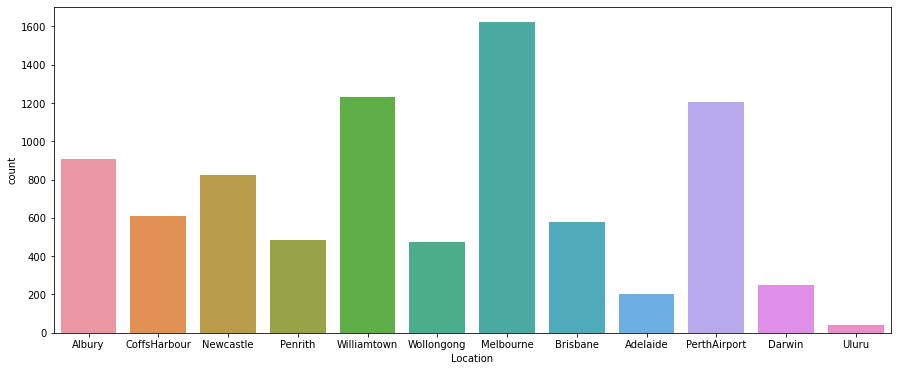

In [31]:
# LET'S PLOT SOME GRAPH TO CHEKC 
plt.figure(figsize=(15,6))
sns.countplot(x="Location",data=rain_forecast)

AS WE CAN SEE THT MAXIMUM NUMNER OF DATATSET CONTAIN DATA FROM THE MELBOURNE CITY AND LESS NUMBER OF DATA FOM THE ULURU CITY

<AxesSubplot:xlabel='WindGustDir', ylabel='count'>

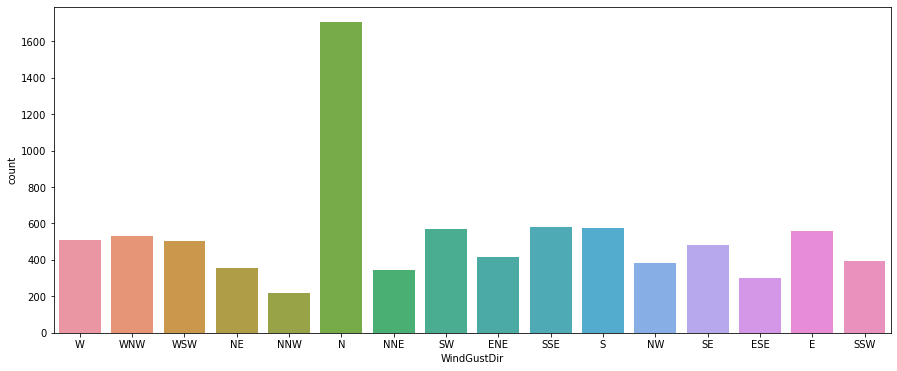

In [32]:
plt.figure(figsize=(15,6))
sns.countplot(x="WindGustDir",data=rain_forecast)

AS WE CAN CLEALRY SEE THAT NORTH DIRECTION FLOW OF THE WIND IS MORE ANMD HAVE HIGHEST IN THE DATSET SO WE CAN SAY MOST OD THE TIME IN AUSTARLIA WIND DIRECTON IS NORTHERN SIDE 

<AxesSubplot:xlabel='RainTomorrow', ylabel='count'>

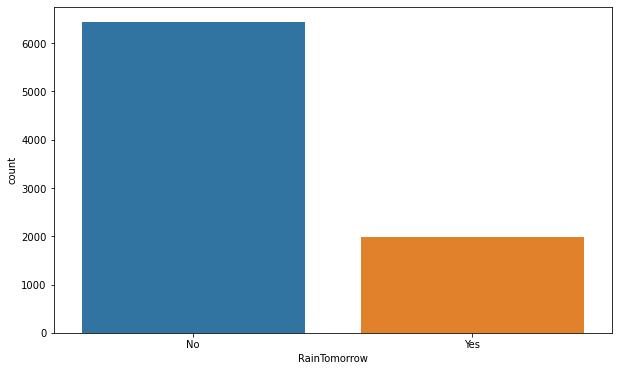

In [58]:
plt.figure(figsize=(10,6))
sns.countplot(x="RainTomorrow",data=rain_forecast)

<AxesSubplot:xlabel='WindGustSpeed', ylabel='count'>

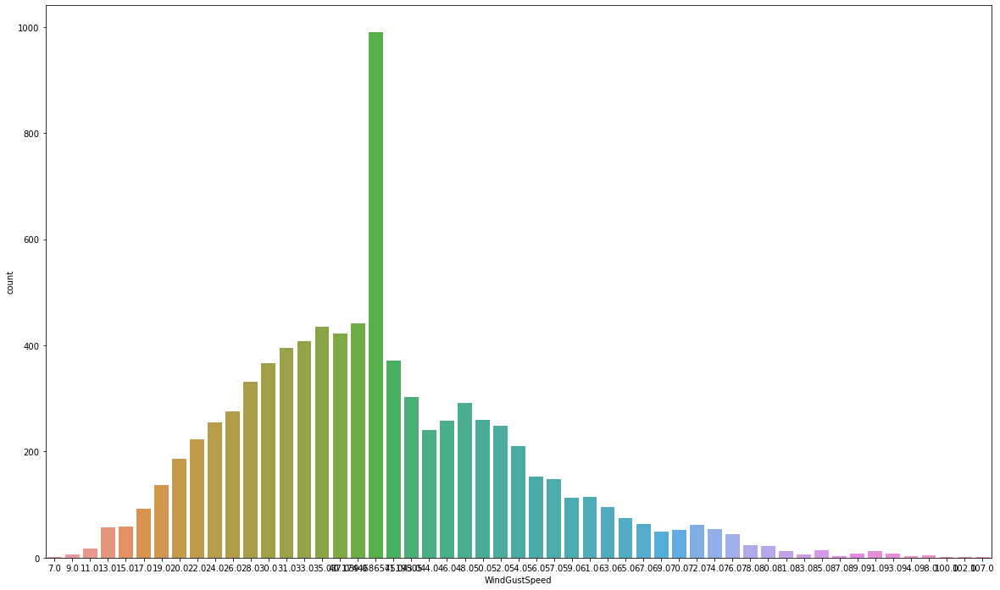

In [63]:
plt.figure(figsize=(20,12))
sns.countplot(x="WindGustSpeed",data=rain_forecast)

<AxesSubplot:xlabel='Month', ylabel='count'>

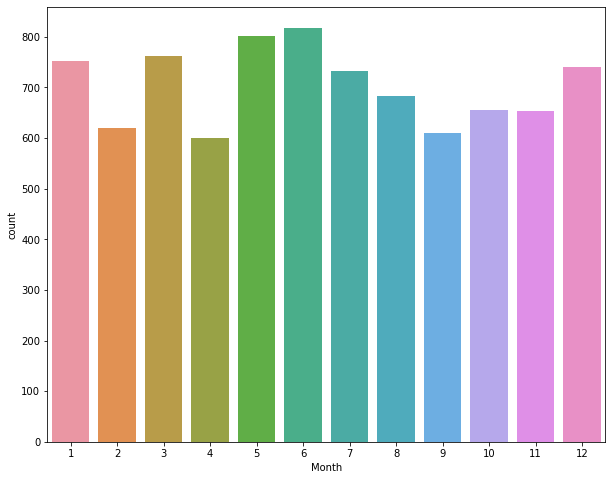

In [65]:
plt.figure(figsize=(10,8))
sns.countplot(x="Month",data=rain_forecast)

<AxesSubplot:xlabel='WindSpeed9am', ylabel='count'>

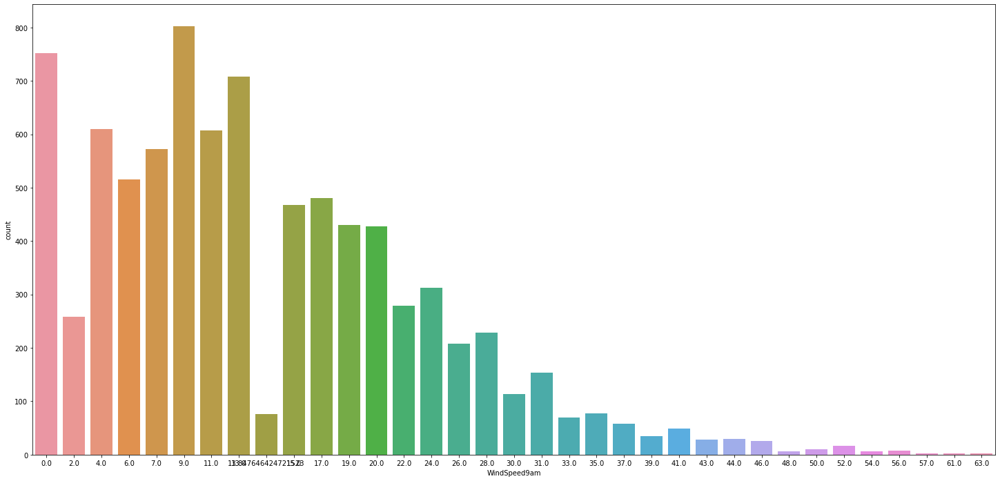

In [69]:
plt.figure(figsize=(25,12))
sns.countplot(x="WindSpeed9am",data=rain_forecast)

<AxesSubplot:xlabel='WindDir9am', ylabel='count'>

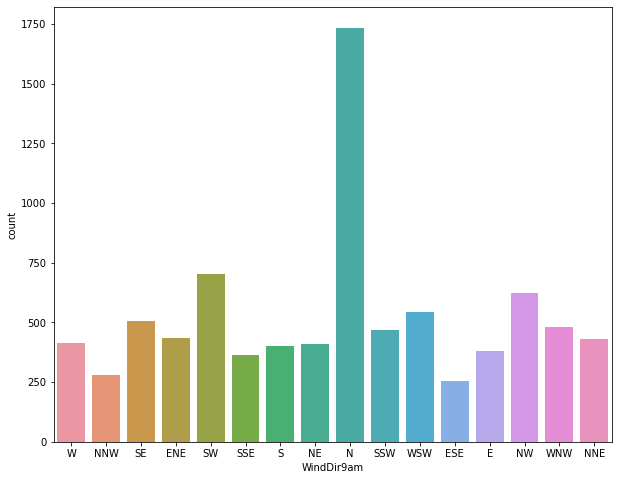

In [70]:
plt.figure(figsize=(10,8))
sns.countplot(x="WindDir9am",data=rain_forecast)

<AxesSubplot:xlabel='WindDir3pm', ylabel='count'>

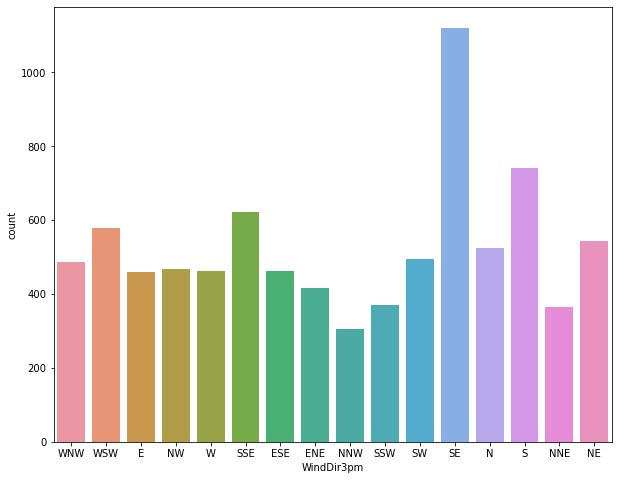

In [71]:
plt.figure(figsize=(10,8))
sns.countplot(x="WindDir3pm",data=rain_forecast)

# BIVARIATE ANALYSIS 

<AxesSubplot:xlabel='Rainfall', ylabel='WindGustSpeed'>

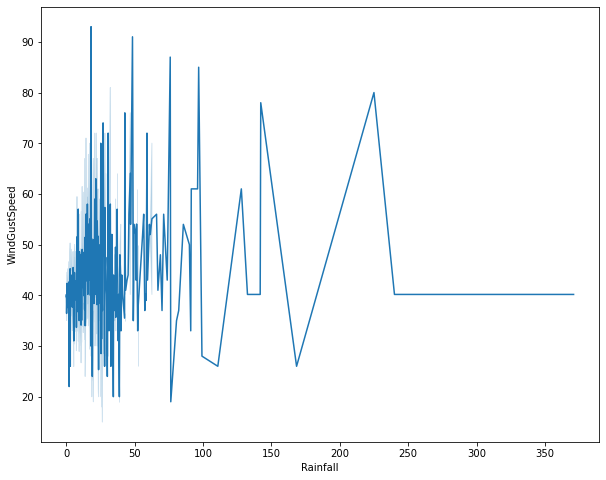

In [76]:
plt.figure(figsize=(10,8))
sns.lineplot(y="WindGustSpeed",x="Rainfall",data=rain_forecast)

<AxesSubplot:xlabel='Location', ylabel='Month'>

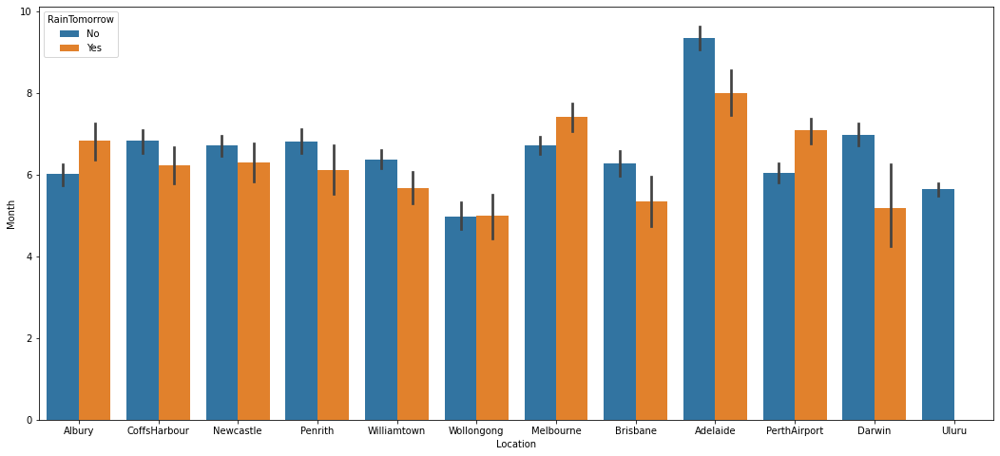

In [82]:
plt.figure(figsize=(18,8))
sns.barplot(x="Location",y="Month",hue="RainTomorrow",data=rain_forecast)

<AxesSubplot:xlabel='Location', ylabel='Rainfall'>

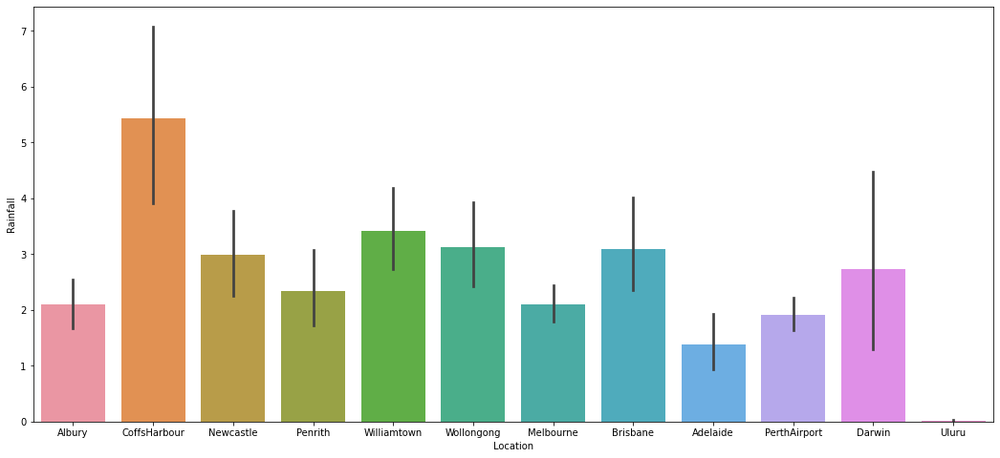

In [79]:
plt.figure(figsize=(18,8))
sns.barplot(x="Location",y="Rainfall",data=rain_forecast)

<AxesSubplot:xlabel='Location', ylabel='Sunshine'>

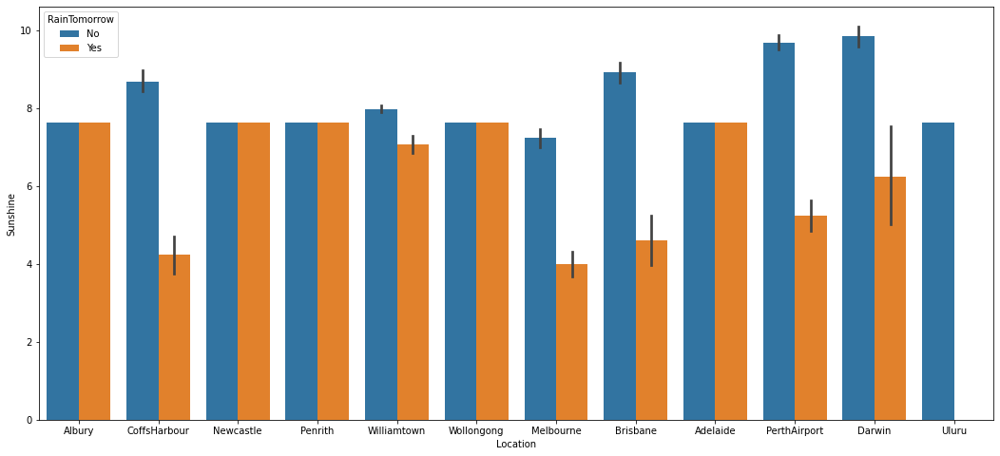

In [85]:
plt.figure(figsize=(18,8))
sns.barplot(x="Location",y="Sunshine",hue="RainTomorrow",data=rain_forecast)

<AxesSubplot:xlabel='Evaporation', ylabel='Rainfall'>

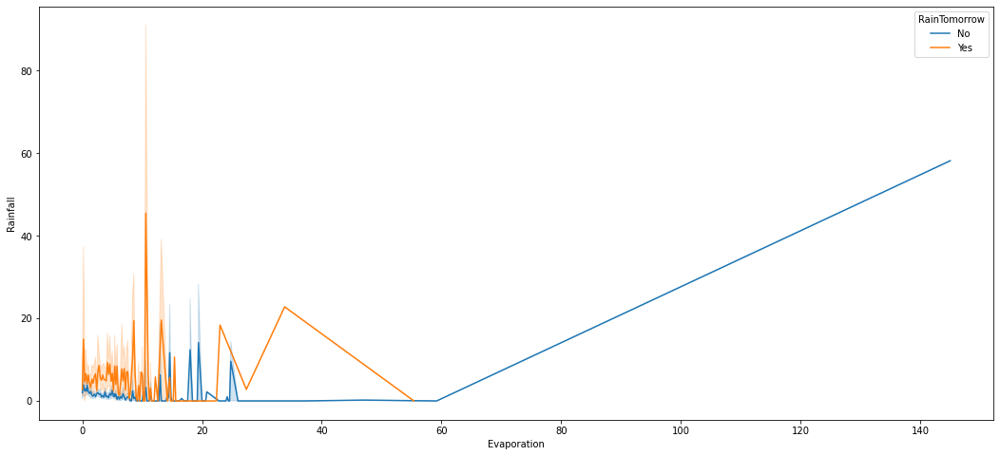

In [87]:
plt.figure(figsize=(18,8))
sns.lineplot(x="Evaporation",y="Rainfall",hue="RainTomorrow",data=rain_forecast)

<AxesSubplot:xlabel='MinTemp', ylabel='MaxTemp'>

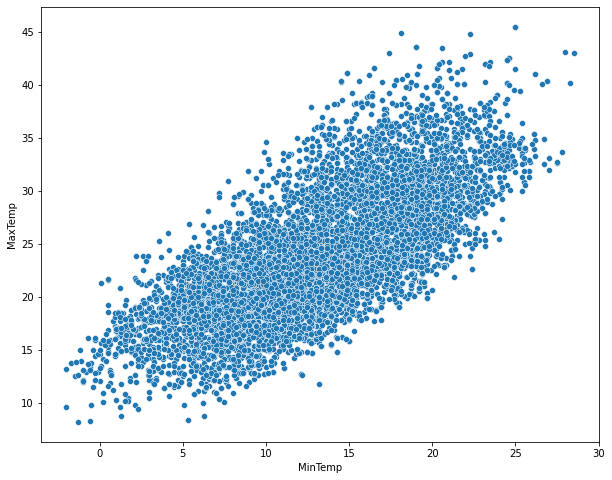

In [90]:
plt.figure(figsize=(10,8))
sns.scatterplot(x="MinTemp",y="MaxTemp",data=rain_forecast)

<AxesSubplot:xlabel='Humidity9am', ylabel='Humidity3pm'>

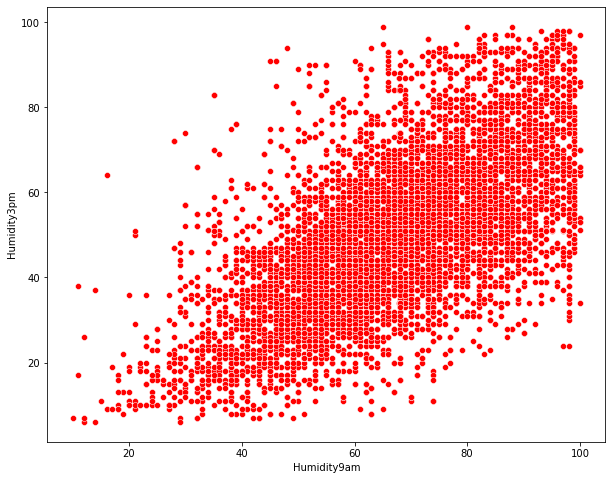

In [92]:
plt.figure(figsize=(10,8))
sns.scatterplot(x="Humidity9am",y="Humidity3pm",data=rain_forecast,color="red")

<AxesSubplot:xlabel='Humidity3pm', ylabel='RainTomorrow'>

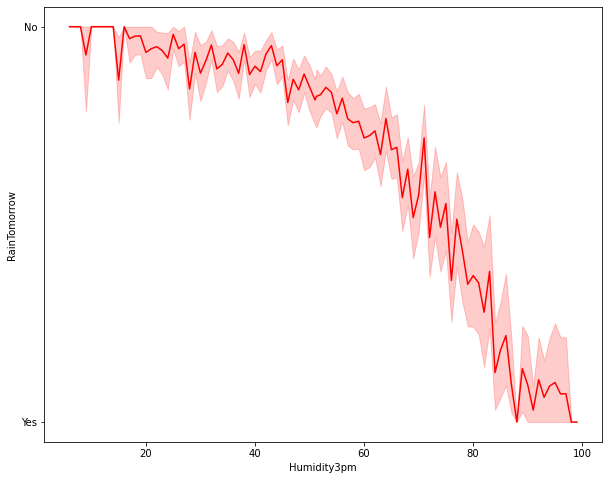

In [106]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Humidity3pm",y="RainTomorrow",data=rain_forecast,color="red")

<AxesSubplot:xlabel='Humidity9am', ylabel='RainTomorrow'>

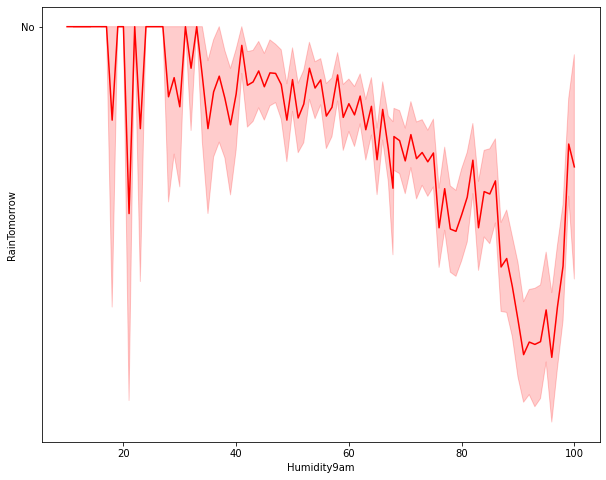

In [108]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Humidity9am",y="RainTomorrow",data=rain_forecast,color="red")

<AxesSubplot:xlabel='Humidity9am', ylabel='Rainfall'>

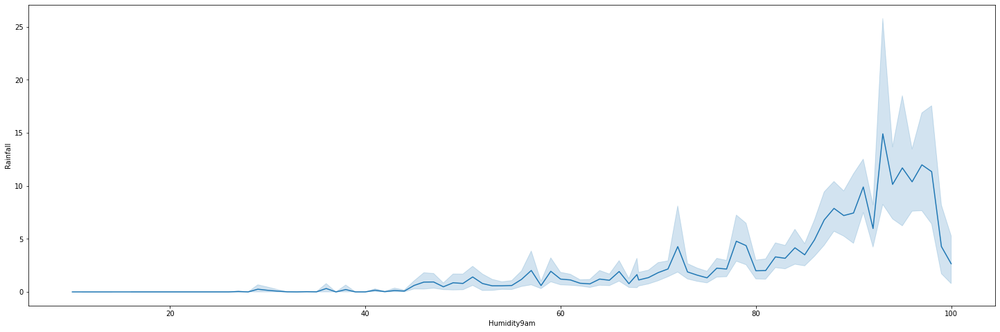

In [113]:
plt.figure(figsize=(25,8))
sns.lineplot(x="Humidity9am",y="Rainfall",data=rain_forecast)

<AxesSubplot:xlabel='WindGustDir', ylabel='MaxTemp'>

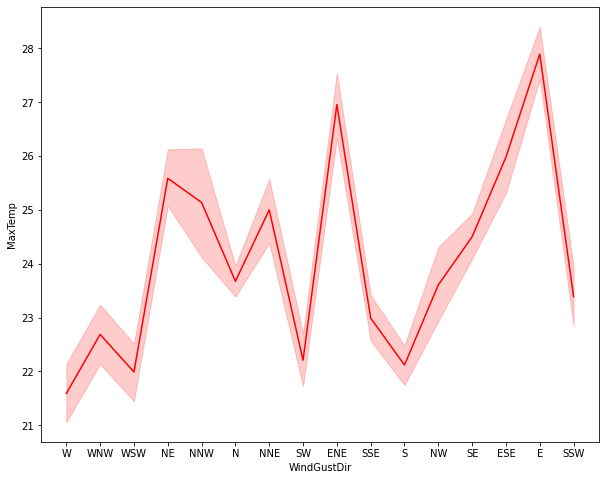

In [117]:
plt.figure(figsize=(10,8))
sns.lineplot(x="WindGustDir",y="MaxTemp",data=rain_forecast,color="red")

<AxesSubplot:xlabel='Pressure9am', ylabel='Rainfall'>

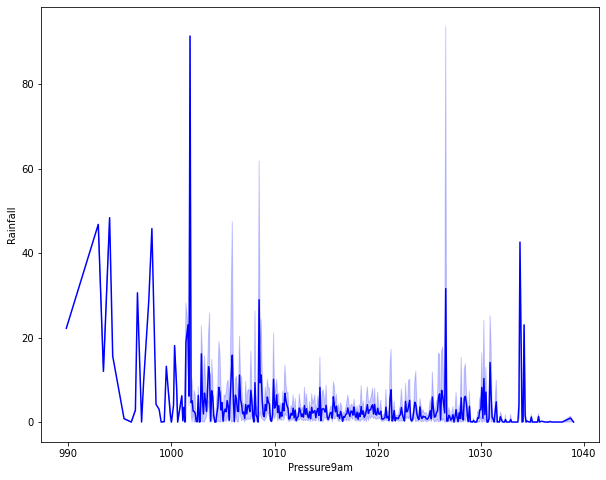

In [129]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Pressure9am",y="Rainfall",data=rain_forecast,color="blue")

<AxesSubplot:xlabel='Cloud9am', ylabel='Rainfall'>

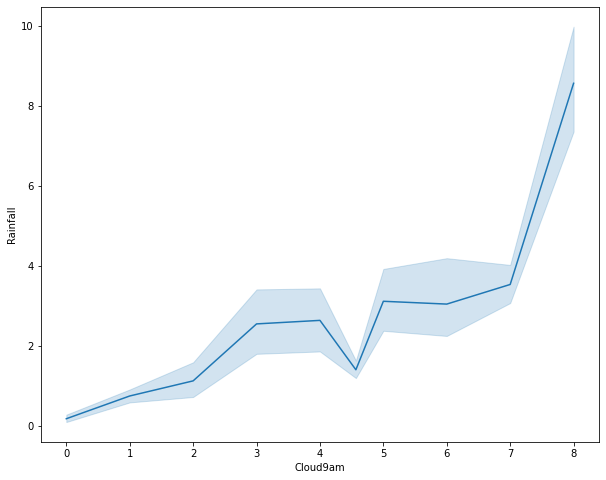

In [130]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Cloud9am",y="Rainfall",data=rain_forecast)

<AxesSubplot:xlabel='Cloud3pm', ylabel='Rainfall'>

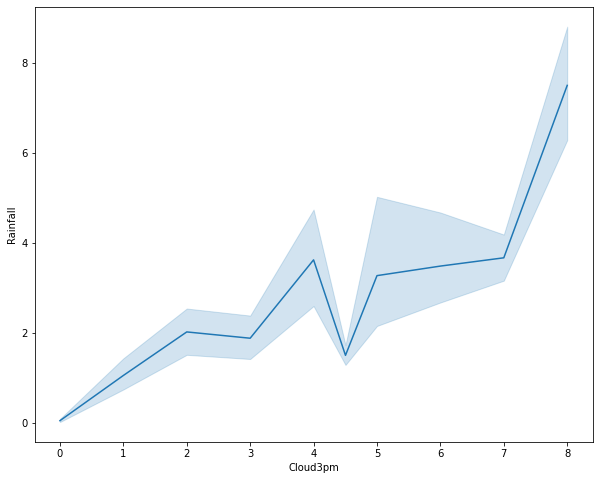

In [132]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Cloud3pm",y="Rainfall",data=rain_forecast)

<AxesSubplot:xlabel='Cloud9am', ylabel='RainTomorrow'>

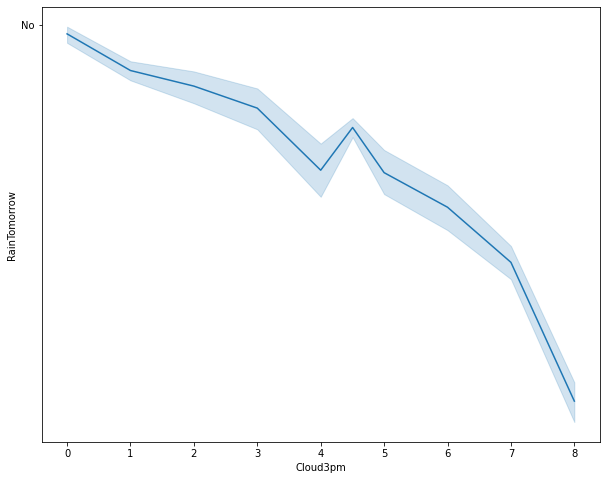

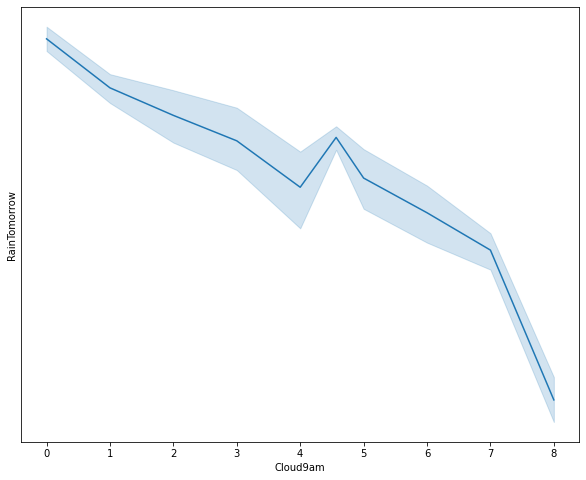

In [134]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Cloud3pm",y="RainTomorrow",data=rain_forecast)
plt.figure(figsize=(10,8))
sns.lineplot(x="Cloud9am",y="RainTomorrow",data=rain_forecast)

<AxesSubplot:xlabel='Location', ylabel='Cloud9am'>

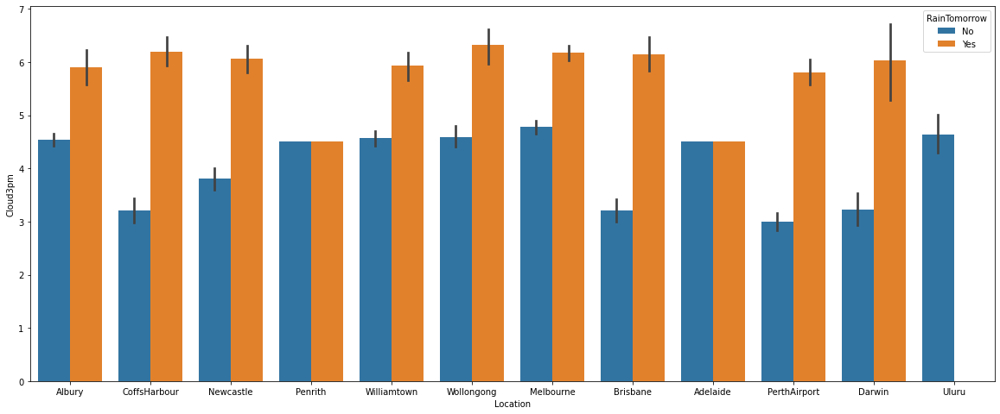

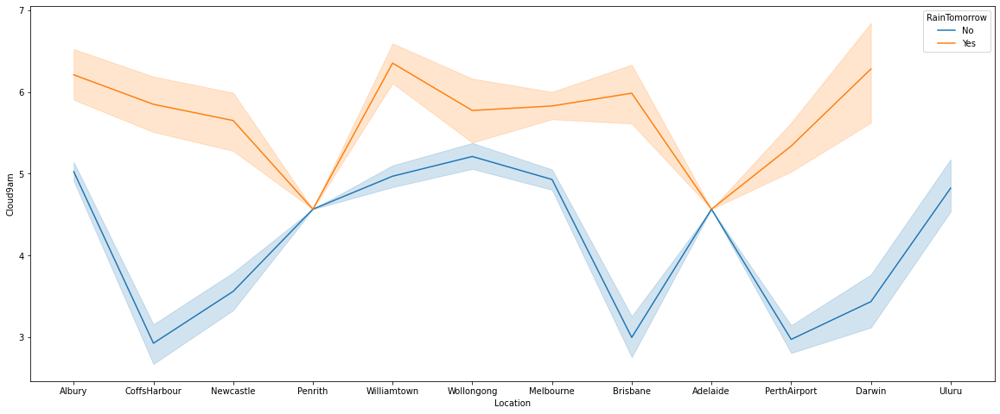

In [138]:
plt.figure(figsize=(20,8))
sns.barplot(y="Cloud3pm",x="Location",hue="RainTomorrow",data=rain_forecast)
plt.figure(figsize=(20,8))
sns.lineplot(y="Cloud9am",x="Location",hue="RainTomorrow",data=rain_forecast)

<AxesSubplot:xlabel='WindGustDir', ylabel='WindGustSpeed'>

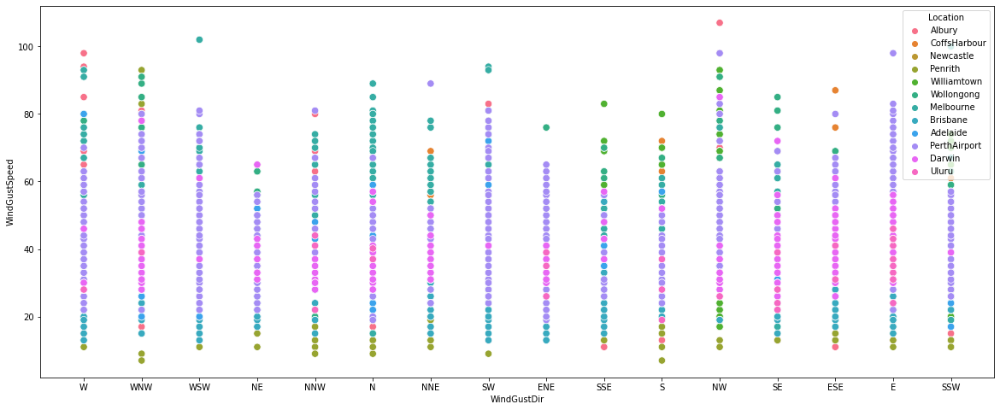

In [40]:
plt.figure(figsize=(20,8))
sns.scatterplot(y="WindGustSpeed",x="WindGustDir",hue="Location",data=rain_forecast,s=70)

<Figure size 720x576 with 0 Axes>

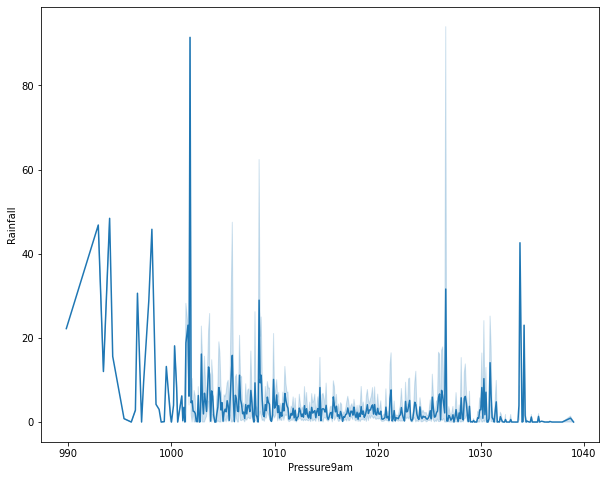

<Figure size 720x576 with 0 Axes>

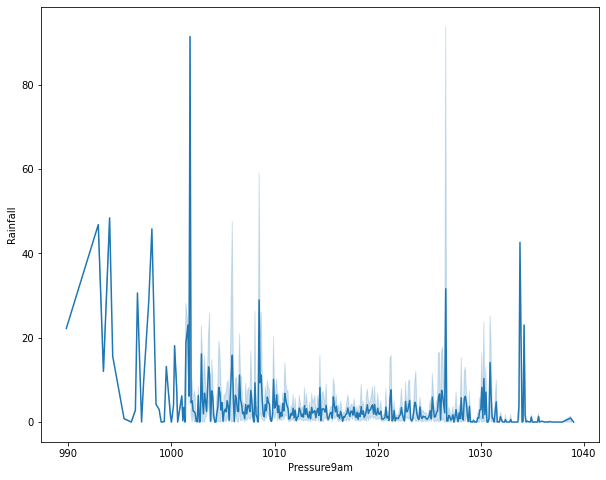

<Figure size 720x576 with 0 Axes>

In [44]:
plt.figure(figsize=(10,8))
sns.lineplot(x="Pressure9am",y="Rainfall",data=rain_forecast)
plt.figure(figsize=(10,8))
plt.figure(figsize=(10,8))
sns.lineplot(x="Pressure9am",y="Rainfall",data=rain_forecast)
plt.figure(figsize=(10,8))

<AxesSubplot:xlabel='Year', ylabel='Rainfall'>

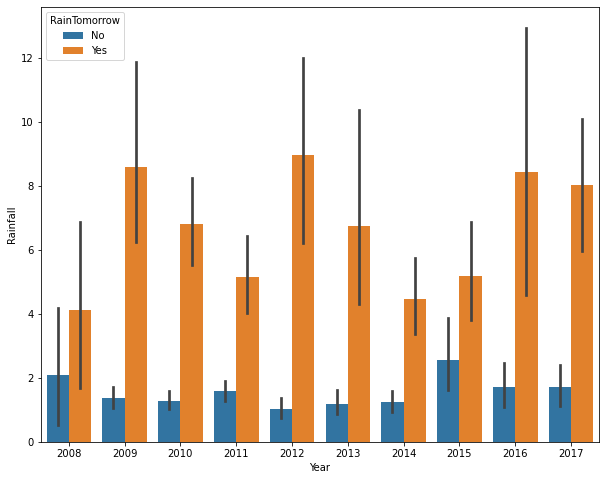

In [51]:
plt.figure(figsize=(10,8))
sns.barplot(x="Year",y="Rainfall",hue="RainTomorrow",data=rain_forecast)


<AxesSubplot:xlabel='Year', ylabel='Rainfall'>

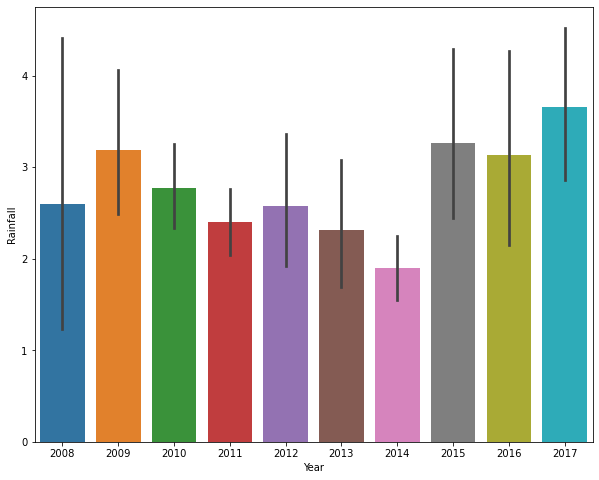

In [52]:
plt.figure(figsize=(10,8))
sns.barplot(x="Year",y="Rainfall",data=rain_forecast)


# MULTIVARIATE ANALYSIS

<Figure size 1440x1080 with 0 Axes>

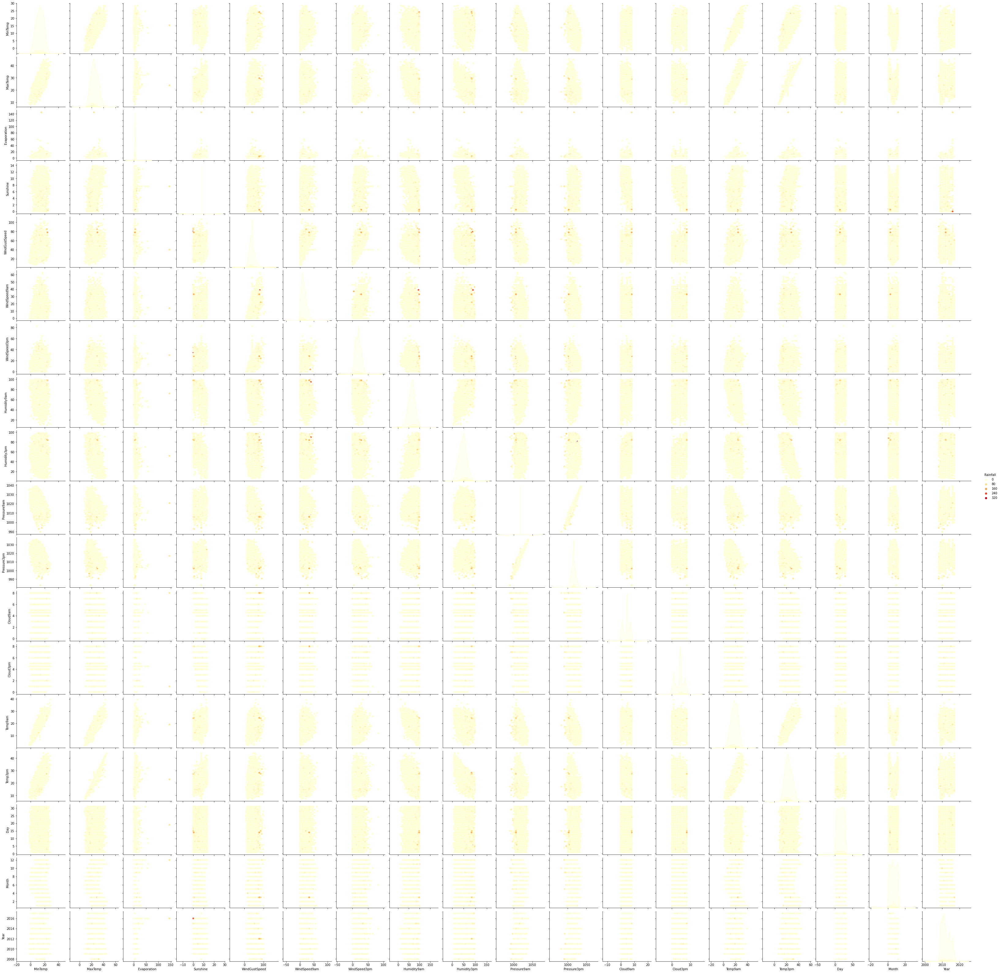

In [53]:
plt.figure(figsize=(20,15))
sns.pairplot(rain_forecast,hue='Rainfall',palette='YlOrRd')
plt.show()

<Figure size 1800x1584 with 0 Axes>

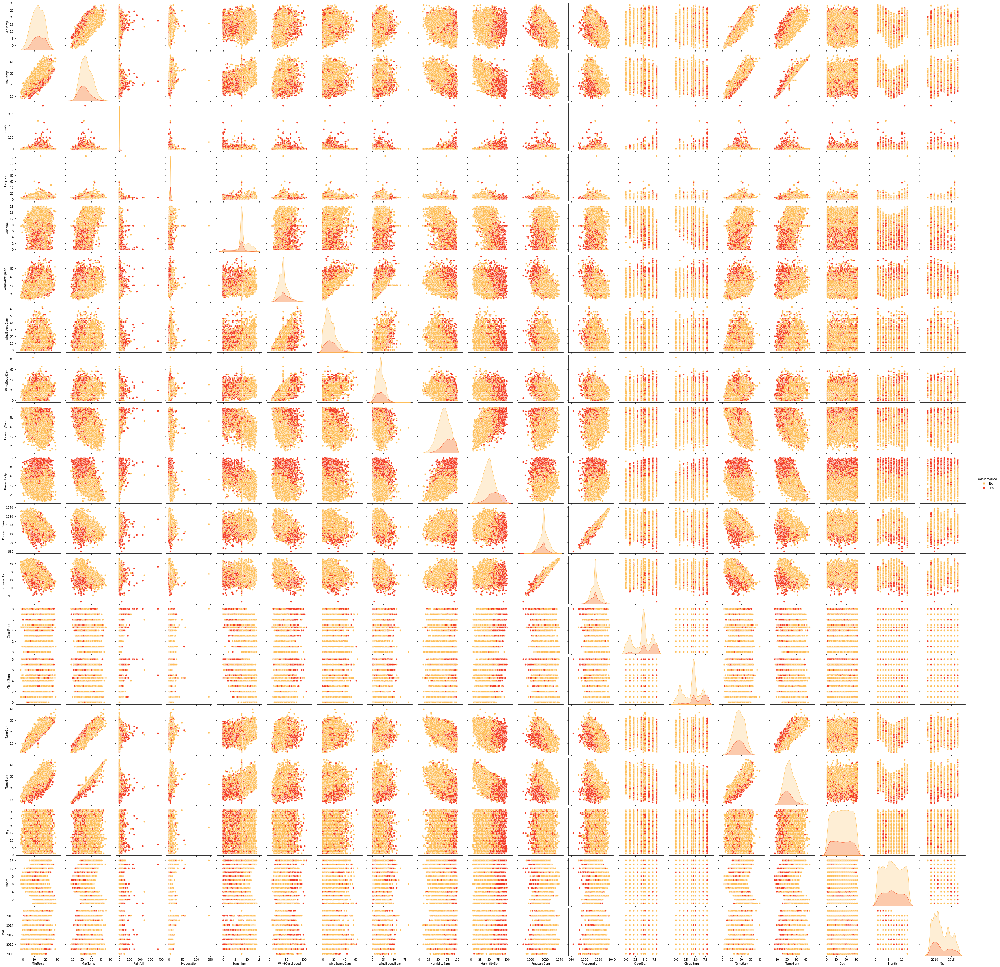

In [54]:
plt.figure(figsize=(25,22))
sns.pairplot(rain_forecast,hue='RainTomorrow',palette='YlOrRd')
plt.show()

# NOW WE DO PREPROCESSING 

In [33]:
rain_forecast

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


# OUTLIERS

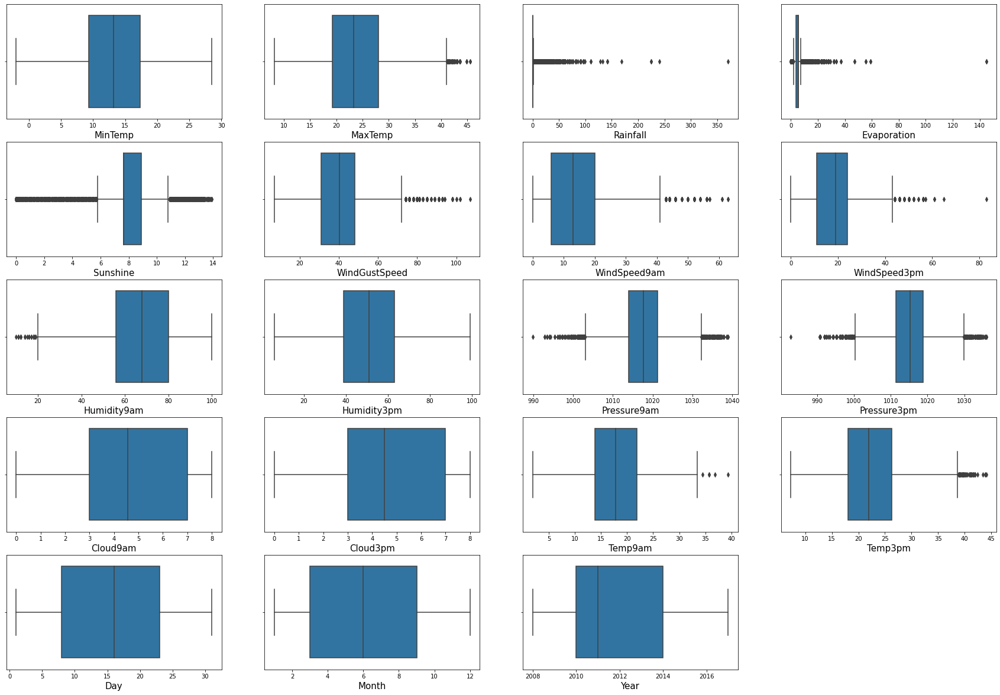

In [34]:
# LET'S FIND OUTLIERS IN THE DATASET 
num_col=['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']
plt.figure(figsize=(30,25))
plotnumber=1
for feature in num_col:
    if plotnumber<=30:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(rain_forecast[feature])
        plt.xlabel(feature,fontsize=15)
    plotnumber+=1
plt.show()

AS WE CAN CLEALY SEE THAT  PRESSURE9AM , WIND SPEED 9AM , WIND SPEED 3PM, WINDGUSTSPEED, SUNSHINE, HIMIDITY 9AM, HIMIDITY 3PM, MAX_TEMP, RAINFALL, EVAPORATION. ALL THESE FEATURE CONTAIN THE OUTLIERS WHICH WE HAVE TO REMOVE FROM OUR DATASET  

# Z - SCORE

In [35]:
# LET'S USE Z- SCORE METHOD TO REMOVE THE OUTLIERS
feature_with_outliers= rain_forecast[["MaxTemp","Temp9am","Pressure9am","Pressure3pm","WindGustSpeed","Sunshine","WindSpeed9am","WindSpeed3pm","Evaporation","Rainfall","Temp3pm"]]


In [36]:
from scipy.stats import zscore
z=np.abs(zscore(feature_with_outliers))

In [37]:
z

,MaxTemp,Temp9am,Pressure9am,Pressure3pm,WindGustSpeed,Sunshine,WindSpeed9am,WindSpeed3pm,Evaporation,Rainfall,Temp3pm
0,1.570089e-01,0.153712,1.584003,1.308665,0.277710,1.257472e-15,0.607461,0.563297,2.305893e-16,0.206021,0.108138
1,2.028121e-01,0.100217,1.121880,1.196072,0.277710,1.257472e-15,0.972321,0.357200,2.305893e-16,0.264165,0.312348
2,3.009450e-01,0.577390,1.599939,1.051309,0.422897,1.257472e-15,0.508725,0.769394,2.305893e-16,0.264165,0.127334
3,6.771214e-01,0.060269,0.006411,0.391836,1.174166,1.257472e-15,0.281166,0.982428,2.305893e-16,0.264165,0.682376
4,1.380408e+00,0.006773,1.090010,1.485596,0.059928,1.257472e-15,0.676112,0.151104,2.305893e-16,0.167258,1.220599
...,...,...,...,...,...,...,...,...,...,...,...
8420,7.523137e-02,1.366273,1.109058,0.814518,0.666009,1.257472e-15,0.083694,0.776331,2.305893e-16,0.264165,0.007221
8421,2.355231e-01,1.223619,0.933770,0.621501,1.319354,1.257472e-15,0.083694,0.982428,2.305893e-16,0.264165,0.345987
8422,4.972110e-01,0.938310,0.535388,0.251553,0.230447,1.257472e-15,0.478639,0.982428,2.305893e-16,0.264165,0.615099
8423,5.135665e-01,0.474684,0.280424,0.203299,0.883791,1.257472e-15,0.083694,1.188525,2.305893e-16,0.264165,0.598279


AS WE CAN SEEWE HAVE REDUCE THE DATA INTO Z SCORE NOW WE CAN FIND THE OUTLIERS AND WE SET THRESHOLD LESS THAN 5

In [38]:
# We have assumed the Z-score threshold < 3 will have no outliers 

rain_forecast_new= rain_forecast[(z<3).all(axis=1)]

In [39]:
rain_forecast_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,24,6,2017


AS WE CAN SEE THAT OUR ORIGINAL ROW COUNT WAS 8425 AND NOW IT IS 7998 ALMOST 500 ROWS WE HAVE REMOVED WHICH CONTAIN OUTLIERS 

# SKWENESS

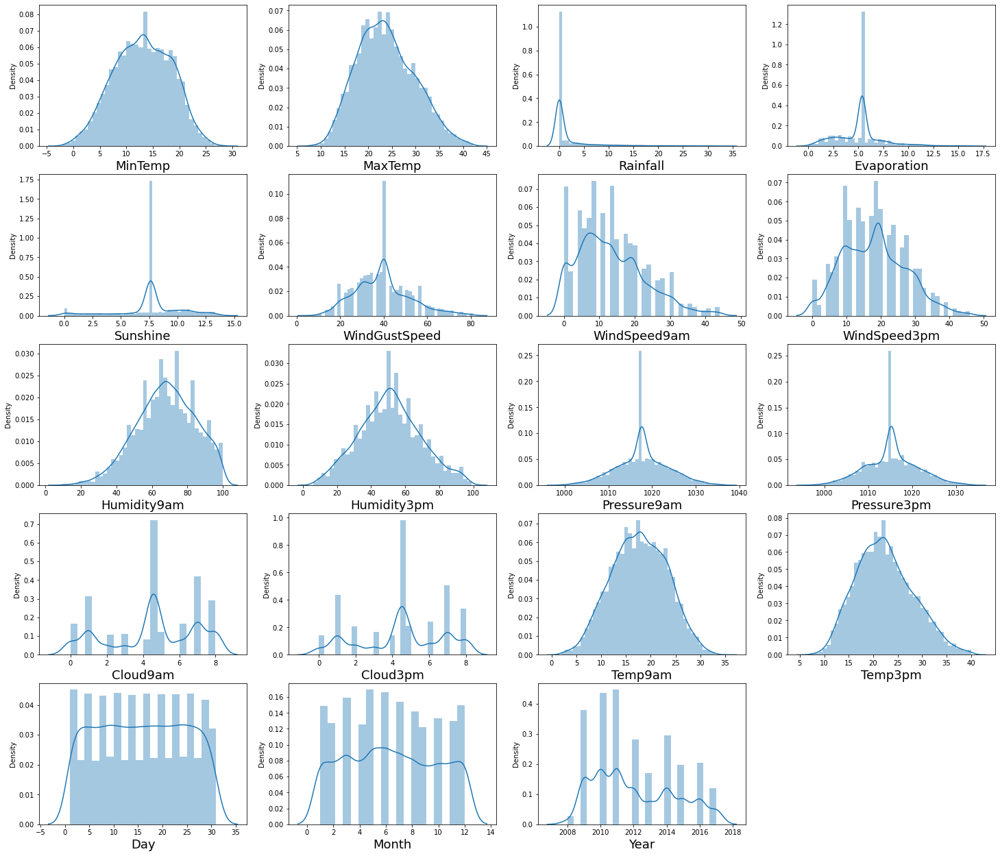

In [40]:
# LET'S CHECK THE SKWENESS OF OUR DATASET USING DISTPLOT
plt.figure(figsize=(25,22))
plotnumber=1
for column in num_col:
    if plotnumber<=25:
        ax=plt.subplot(5,4,plotnumber)
        sns.distplot(rain_forecast_new[column])
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.show()

BY LOOKING AT THE GRAPH ALL THE FEATURE ARE LOOKING NORMALLY DISTRIBUTED BUT WE CAN'T SAY ANYTHING UNTILL WE THROUGH SKWENESS NUMBER SO WE HAV TO FIND THAT SKWENESS NUMBER AND THEN WE CAN REMOVE ANY SKWENESS IF PRESENT 

In [41]:
rain_forecast_new.skew()

MinTemp         -0.084811
MaxTemp          0.316090
Rainfall         3.521934
Evaporation      0.848348
Sunshine        -0.723504
WindGustSpeed    0.505365
WindSpeed9am     0.708414
WindSpeed3pm     0.299685
Humidity9am     -0.262037
Humidity3pm      0.118483
Pressure9am      0.021059
Pressure3pm      0.045668
Cloud9am        -0.356177
Cloud3pm        -0.266607
Temp9am         -0.033187
Temp3pm          0.335989
Day              0.002798
Month            0.052812
Year             0.429397
dtype: float64

AS WE CAN CLEARLY SEE THAT ALL THE FEATURE HAVE VALUE WITHIN THE RANGE SO THERE IS NO SKWENESS PRESENT IN THE DATASET SO OUR DATASET IS CLEAN FROM OUTLIERS AND SKWENESS 

In [42]:
rain_forecast_new['RainTomorrow'] = rain_forecast_new['RainTomorrow'].map({'No': 0, 'Yes': 1})

In [43]:
rain_forecast_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,0,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,0,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,0,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,0,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,0,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,0,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,0,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,0,24,6,2017


# HEATMAP

In [44]:
corr=rain_forecast_new.corr()
corr

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow,Day,Month,Year
MinTemp,1.000000,0.718259,0.088424,0.373186,0.066051,0.231354,0.144970,0.185730,-0.129269,0.087503,-0.433453,-0.428263,0.088896,0.036393,0.887810,0.687543,0.090271,0.011434,-0.245560,0.040447
MaxTemp,0.718259,1.000000,-0.139161,0.470991,0.387757,0.137257,0.014928,0.093314,-0.387722,-0.412790,-0.334042,-0.414848,-0.253518,-0.248521,0.865565,0.974917,-0.150730,0.017556,-0.161469,0.120240
Rainfall,0.088424,-0.139161,1.000000,-0.092964,-0.162127,0.087920,0.051163,0.030256,0.293819,0.289129,-0.098042,-0.038641,0.220894,0.187162,-0.034515,-0.147185,0.268179,-0.013876,-0.007495,0.005823
Evaporation,0.373186,0.470991,-0.092964,1.000000,0.370067,0.201453,0.142392,0.105030,-0.329115,-0.234720,-0.262522,-0.276564,-0.117579,-0.147215,0.441977,0.456385,-0.090264,0.012598,-0.053421,0.123660
Sunshine,0.066051,0.387757,-0.162127,0.370067,1.000000,0.010443,-0.003193,0.046597,-0.366641,-0.437825,-0.004686,-0.064592,-0.527785,-0.542079,0.262867,0.403897,-0.317914,0.003910,0.000024,0.054481
WindGustSpeed,0.231354,0.137257,0.087920,0.201453,0.010443,1.000000,0.577538,0.628169,-0.264019,-0.085931,-0.377548,-0.336525,0.012919,0.063903,0.199679,0.102669,0.181053,-0.004758,0.046375,-0.035548
WindSpeed9am,0.144970,0.014928,0.051163,0.142392,-0.003193,0.577538,1.000000,0.548339,-0.360814,-0.109587,-0.150833,-0.105689,-0.006169,0.042165,0.111545,0.000305,0.057120,-0.008252,0.031569,-0.090574
WindSpeed3pm,0.185730,0.093314,0.030256,0.105030,0.046597,0.628169,0.548339,1.000000,-0.243679,-0.080966,-0.229757,-0.177239,0.004185,-0.002548,0.190189,0.071611,0.042346,-0.011689,0.042311,-0.062368
Humidity9am,-0.129269,-0.387722,0.293819,-0.329115,-0.366641,-0.264019,-0.360814,-0.243679,1.000000,0.629967,0.132997,0.164288,0.403956,0.300503,-0.374770,-0.381031,0.270113,0.006152,-0.116131,0.105386
Humidity3pm,0.087503,-0.412790,0.289129,-0.234720,-0.437825,-0.085931,-0.109587,-0.080966,0.629967,1.000000,-0.006932,0.063465,0.416520,0.436915,-0.120136,-0.481677,0.445946,0.015337,-0.076135,-0.027773


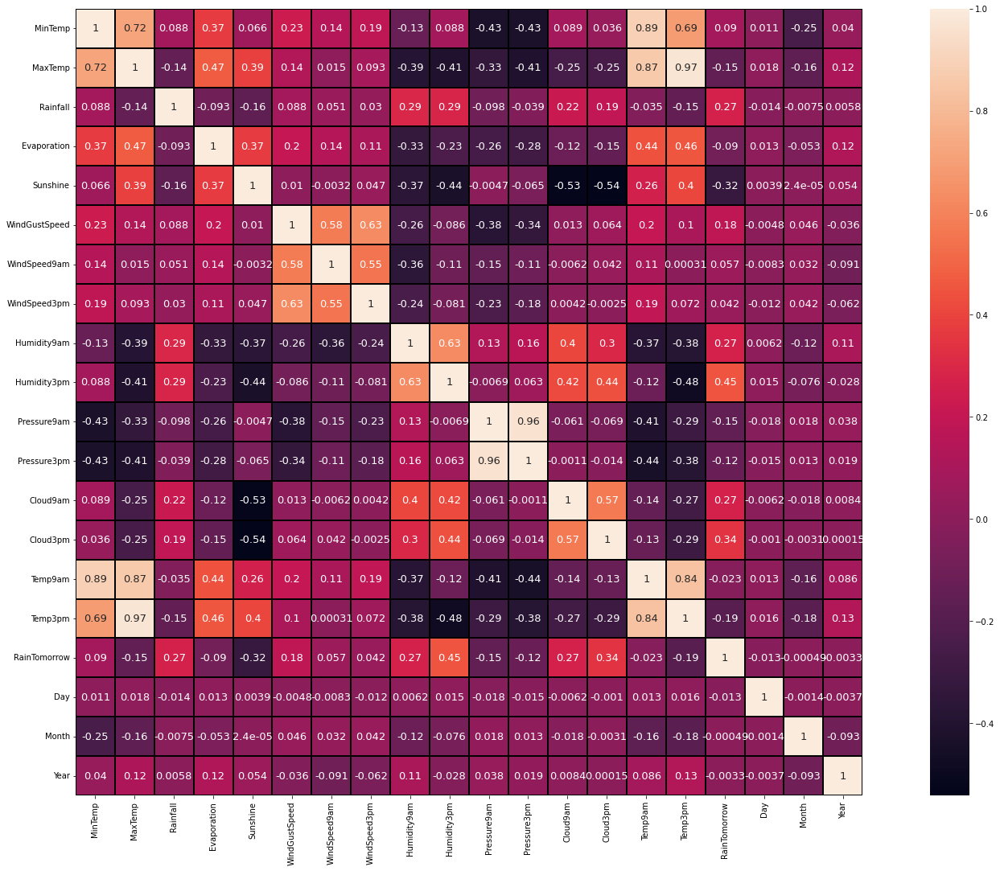

In [45]:
plt.figure(figsize=(30,18))
sns.heatmap(corr,annot=True,annot_kws={'size':13},square=True,linewidth=2,linecolor='black')
plt.show()

1. AS WE CAN SEE CLEALRY THROUGH HEATMAP THAT RAINFALL IS POSITIVE CORRELATED WITH CLOUD , HUMIDITY , WIND,  AND DAY, MONTH, YEAR , TEMP , EVAPORATION IS NEAGITIVELY CORRELATED WITH EACH OTHER 

2. AS WE CAN SEE THAT RAINTOMORROW HAVE POSITIVE CORRELATION WITH CLOUD, HUMIDITY , WIND, RAINFALLAND NEAGITIVELY CORRELATED WITH PRESSURE , SUNSHINE , TEMP 
BUT FOR FURTHER WE HAVE TO CHECK THE MULTICOLLINEARITY OF THE FEATURE 

In [46]:
corr["RainTomorrow"].sort_values(ascending=False)

RainTomorrow     1.000000
Humidity3pm      0.445946
Cloud3pm         0.337858
Humidity9am      0.270113
Cloud9am         0.269768
Rainfall         0.268179
WindGustSpeed    0.181053
MinTemp          0.090271
WindSpeed9am     0.057120
WindSpeed3pm     0.042346
Month           -0.000488
Year            -0.003321
Day             -0.012643
Temp9am         -0.022909
Evaporation     -0.090264
Pressure3pm     -0.124337
MaxTemp         -0.150730
Pressure9am     -0.152119
Temp3pm         -0.192550
Sunshine        -0.317914
Name: RainTomorrow, dtype: float64

In [47]:
# let's visulaize this target variable with other features 
corr_target = corr['RainTomorrow'].sort_values(ascending=False).drop('RainTomorrow')
corr_df = pd.DataFrame(corr_target)
corr_df.reset_index(inplace=True)

In [48]:
corr_df

,index,RainTomorrow
0,Humidity3pm,0.445946
1,Cloud3pm,0.337858
2,Humidity9am,0.270113
3,Cloud9am,0.269768
4,Rainfall,0.268179
5,WindGustSpeed,0.181053
6,MinTemp,0.090271
7,WindSpeed9am,0.057120
8,WindSpeed3pm,0.042346
9,Month,-0.000488


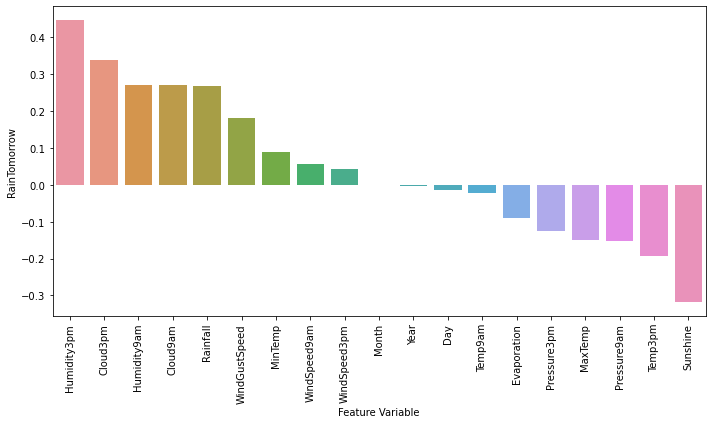

In [49]:
plt.figure(figsize=(10, 6))
sns.barplot(x='index', y='RainTomorrow', data=corr_df)
plt.xlabel('Feature Variable')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [50]:
# NOW WE SEE FOR SECOND TARGET VARIABLE 
corr["Rainfall"].sort_values(ascending=False)

Rainfall         1.000000
Humidity9am      0.293819
Humidity3pm      0.289129
RainTomorrow     0.268179
Cloud9am         0.220894
Cloud3pm         0.187162
MinTemp          0.088424
WindGustSpeed    0.087920
WindSpeed9am     0.051163
WindSpeed3pm     0.030256
Year             0.005823
Month           -0.007495
Day             -0.013876
Temp9am         -0.034515
Pressure3pm     -0.038641
Evaporation     -0.092964
Pressure9am     -0.098042
MaxTemp         -0.139161
Temp3pm         -0.147185
Sunshine        -0.162127
Name: Rainfall, dtype: float64

In [51]:
# let's visulaize this target variable with other features 
corr_target = corr['Rainfall'].sort_values(ascending=False).drop('Rainfall')
corr_df = pd.DataFrame(corr_target)
corr_df.reset_index(inplace=True)

In [52]:
corr_df

,index,Rainfall
0,Humidity9am,0.293819
1,Humidity3pm,0.289129
2,RainTomorrow,0.268179
3,Cloud9am,0.220894
4,Cloud3pm,0.187162
5,MinTemp,0.088424
6,WindGustSpeed,0.087920
7,WindSpeed9am,0.051163
8,WindSpeed3pm,0.030256
9,Year,0.005823


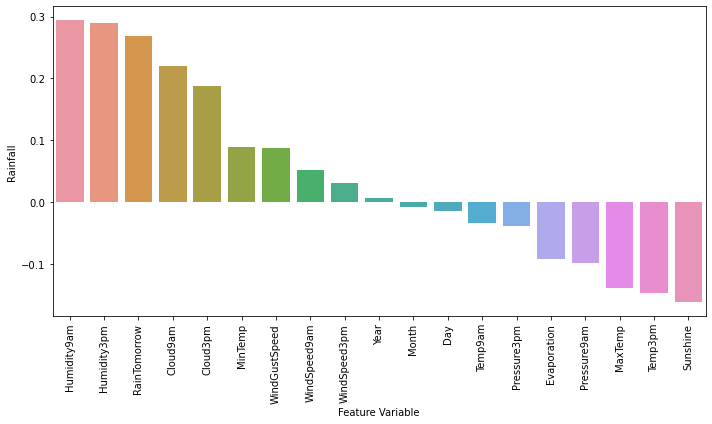

In [53]:
plt.figure(figsize=(10, 6))
sns.barplot(x='index', y='Rainfall', data=corr_df)
plt.xlabel('Feature Variable')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

AS YOU CAN CLEALRY SEE THAT REGION IS THE LEAST COORELATED WITH TARGET VARIABLE AND TOTTAL HIGHLY NEGATIVE COORELATDED WITH TARGET VARIABLE AND TYPE AND YEAR IS POSITIVELY COORELATED WITH OUR TARGET VARIABLE

# NOW WE BUILD OUR REGRESSION MODEL USING AVERAGE PRICE AS TARGET VARIABLE

In [54]:
# LET'S SEPRATE THE TAGET AND FEATURE VARIABLE FROM THE DATASET 
x= rain_forecast_new.drop("RainTomorrow",axis=1)
y= rain_forecast_new["RainTomorrow"]

In [55]:
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,24,6,2017


In [56]:
x.shape

(7998, 24)

In [57]:
y.shape

(7998,)

# ENCODING

In [58]:
# LET'S USE ENCODING TECHINQUE TO CONVERT CATEGORICAL DATA INTO NUMERICAL DATA 
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
categorical_col=["Location","WindGustDir","WindDir9am","WindDir3pm","RainToday"]
for columns in categorical_col:
    x[columns]=LE.fit_transform(x[columns])

In [59]:
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,1,13.4,22.900000,0.6,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,1,12,2008
1,1,7.4,25.100000,0.0,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,2,12,2008
2,1,12.9,25.700000,0.0,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,3,12,2008
3,1,9.2,28.000000,0.0,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,4,12,2008
4,1,17.5,32.300000,1.0,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.0,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,21,6,2017
8421,9,3.6,25.300000,0.0,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,22,6,2017
8422,9,5.4,26.900000,0.0,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,23,6,2017
8423,9,7.8,27.000000,0.0,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,24,6,2017


AS WE CAN SEE TAHT WE HAVE CONVERTED THE CATEGORICAL COLUMN TO NUMERICAL COLUMN NOW OUR DATASET IS PERFECT TO HANDLE AND BUILD MODEL 

# Let's use standard scaler to standarized the data

In [60]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)

In [61]:
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-1.50700,0.055235,-0.148136,-0.264055,0.108158,-0.01436,1.229533,0.363630,1.251602,1.398774,0.711366,0.638189,0.187393,-1.617615,-1.686285,-1.397079,1.425965,0.013610,-0.140581,-0.100971,-0.541993,-1.671507,1.632568,-1.662253
1,-1.50700,-1.059453,0.217490,-0.390351,0.108158,-0.01436,1.442233,0.363630,-0.277157,1.625093,-0.988558,0.421563,-1.440755,-1.451582,-1.201596,-1.278962,0.012599,0.013610,-0.086858,0.326511,-0.541993,-1.557858,1.632568,-1.662253
2,-1.50700,-0.037656,0.317206,-0.390351,0.108158,-0.01436,1.654934,0.520125,1.251602,1.625093,0.605121,0.854814,-1.802566,-1.174862,-1.702998,-1.127098,0.012599,-1.076124,0.593634,0.138419,-0.541993,-1.444208,1.632568,-1.662253
3,-1.50700,-0.725046,0.699452,-0.390351,0.108158,-0.01436,-0.684776,-1.201314,0.378026,-1.769690,-0.244841,-0.986502,-1.380453,-1.949679,-0.031657,-0.435271,0.012599,0.013610,0.074311,0.702696,-0.541993,-1.330558,1.632568,-1.662253
4,-1.50700,0.816937,1.414085,-0.179857,0.108158,-0.01436,1.229533,0.128889,-1.369128,-0.185458,-0.669822,0.204938,0.850713,-1.008829,-1.168169,-1.582691,1.014310,1.535913,0.020588,1.249873,-0.541993,-1.216909,1.632568,-1.662253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7993,1.02947,-1.914046,-0.065040,-0.390351,0.108158,-0.01436,-1.535579,-0.653583,0.378026,-1.543371,-0.032351,-0.769877,-1.018643,-1.506926,1.138282,0.830267,0.012599,0.013610,-1.358303,0.001624,-0.541993,0.601485,-0.124844,2.004688
7994,1.02947,-1.765421,0.250729,-0.390351,0.108158,-0.01436,-0.259374,-1.357809,0.378026,-1.090733,-0.032351,-0.986502,-0.717134,-1.672959,0.954434,0.627781,0.012599,0.013610,-1.215042,0.360710,-0.541993,0.715134,-0.124844,2.004688
7995,1.02947,-1.431015,0.516639,-0.390351,0.108158,-0.01436,-0.897477,-0.184100,0.378026,1.398774,-0.457332,-0.986502,-0.898039,-1.506926,0.536599,0.239682,0.012599,0.013610,-0.928519,0.634299,-0.541993,0.828784,-0.124844,2.004688
7996,1.02947,-0.985140,0.533258,-0.390351,0.108158,-0.01436,0.378729,-0.888325,0.596420,-1.090733,-0.032351,-1.203128,-1.018643,-1.506926,0.269184,0.189061,-0.632309,-1.076124,-0.462919,0.617199,-0.541993,0.942433,-0.124844,2.004688


# As you can see that we have sdtandarized our dataset it measn we have given equal weightatge to the the all datapoints

# LET'S CHECK MULTICOLLINEARITY USING VIF

In [62]:
#  LET'S CHECK THE MULTICOLLINEARITY VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif_data["feature"]=x.columns

In [63]:
vif_data

,VIF_value,feature
0,1.568298,Location
1,8.757570,MinTemp
2,26.439943,MaxTemp
3,1.990043,Rainfall
4,1.547432,Evaporation
5,1.940302,Sunshine
6,1.616325,WindGustDir
7,2.317877,WindGustSpeed
8,1.351719,WindDir9am
9,1.483288,WindDir3pm


We can see that we have high multicolinearity in features: MaxTemp, Pressure9am, Pressure3pm, Temp9am, Temp3pm

In [64]:
# Dropping Temp3pm column
x.drop("Temp3pm",axis=1,inplace=True)

In [65]:
# let's check vif 
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif_data["feature"]=x.columns
vif_data

,VIF_value,feature
0,1.567772,Location
1,8.714357,MinTemp
2,9.675024,MaxTemp
3,1.988651,Rainfall
4,1.546957,Evaporation
5,1.940250,Sunshine
6,1.612874,WindGustDir
7,2.305900,WindGustSpeed
8,1.350670,WindDir9am
9,1.482207,WindDir3pm


In [66]:
# NOW LET'S DROP COLUMN 9AM 
# Dropping Temp3pm column
x.drop("Pressure9am",axis=1,inplace=True)

In [67]:
# let's check vif 
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif_data["feature"]=x.columns
vif_data

,VIF_value,feature
0,1.567758,Location
1,8.593529,MinTemp
2,9.274616,MaxTemp
3,1.986595,Rainfall
4,1.530331,Evaporation
5,1.935833,Sunshine
6,1.598677,WindGustDir
7,2.288415,WindGustSpeed
8,1.329832,WindDir9am
9,1.411570,WindDir3pm


In [68]:
# let's drop temp9am 
x.drop("Temp9am",axis=1,inplace=True)

In [69]:
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x,i) for i in range(x.shape[1])]
vif_data["feature"]=x.columns
vif_data

,VIF_value,feature
0,1.565197,Location
1,4.476922,MinTemp
2,5.506413,MaxTemp
3,1.984463,Rainfall
4,1.526269,Evaporation
5,1.928619,Sunshine
6,1.596960,WindGustDir
7,2.252283,WindGustSpeed
8,1.329830,WindDir9am
9,1.411222,WindDir3pm


AS WE CAN SEE THAT WE HAVE REMOVED THE MULTICOLLINEARUTY FROM THE DATASET NOW OUR DATASET IS PERFECTLY GOOD AND FIT FOR THE MODEL

# OVERSAMPLING

In [70]:
y.value_counts()

0    6176
1    1822
Name: RainTomorrow, dtype: int64

AS WE CAN SEE THAT OUR TARGET VARIABLE DON'T HAVE EQUAL NUMBER OF TARGET VATRIALE SO WE DO'T HAVE OVERFITTING 

In [71]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [72]:
y.value_counts()

0    6176
1    6176
Name: RainTomorrow, dtype: int64

ADS WE CAN SEE THAT WE HAVE NOW EQUAL NUMBER OF DATASTE POINT IN OUR TARGET VARIABLE 

# LET'S BUILD CLASSIFICATION MODEL

# MODEL

In [73]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier,BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,roc_curve
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

# RANDOM FOREST CLASSIFIER 

In [ ]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        RFR = RandomForestClassifier()
        
        RFR.fit(X_train, y_train)
        y_pred = RFR.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=7)
RFR=RandomForestClassifier()
RFR.fit(X_train, y_train)
y_pred = RFR.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of random forest classifier is ")
print(conf)
print("classification_report of random forest classifier at random state is:- ")
print(clas)

# LOGISTIC REGRESSION

In [79]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        logistic_r = LogisticRegression()
        
        logistic_r.fit(X_train, y_train)
        y_pred = logistic_r.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

Best Random State  : 99
 best_accuracy_score:-  78.95588830433023


In [80]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=99)
logistic_r = LogisticRegression()
logistic_r.fit(X_train, y_train)
y_pred = logistic_r.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of random forest classifier is ")
print(conf)
print("classification_report of random forest classifier at random state is:- ")
print(clas)

confusion matrix of random forest classifier is 
[[995 263]
 [257 956]]
classification_report of random forest classifier at random state is:- 
              precision    recall  f1-score   support

           0       0.79      0.79      0.79      1258
           1       0.78      0.79      0.79      1213

    accuracy                           0.79      2471
   macro avg       0.79      0.79      0.79      2471
weighted avg       0.79      0.79      0.79      2471



# KNeighborsClassifier

In [76]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        knn = KNN()
        
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

Best Random State  : 103
 best_accuracy_score:-  88.95184135977338


In [82]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=103)
knn = KNN()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of random forest classifier is ")
print(conf)
print("classification_report of random forest classifier at random state is:- ")
print(clas)

confusion matrix of random forest classifier is 
[[ 967  260]
 [  38 1206]]
classification_report of random forest classifier at random state is:- 
              precision    recall  f1-score   support

           0       0.96      0.79      0.87      1227
           1       0.82      0.97      0.89      1244

    accuracy                           0.88      2471
   macro avg       0.89      0.88      0.88      2471
weighted avg       0.89      0.88      0.88      2471



# Descion Tree Classifier

In [85]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        dtc=DecisionTreeClassifier()
        
        dtc.fit(X_train, y_train)
        y_pred = dtc.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

Best Random State  : 132
 best_accuracy_score:-  89.23512747875354


In [86]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=132)
dtc=DecisionTreeClassifier()
dtc.fit(X_train, y_train)
y_pred = dtc.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of  is DecisionTreeClassifier")
print(conf)
print("classification_report of DecisionTreeClassifier is:- ")
print(clas)

confusion matrix of  is DecisionTreeClassifier
[[1096  141]
 [ 123 1111]]
classification_report of DecisionTreeClassifier is:- 
              precision    recall  f1-score   support

           0       0.90      0.89      0.89      1237
           1       0.89      0.90      0.89      1234

    accuracy                           0.89      2471
   macro avg       0.89      0.89      0.89      2471
weighted avg       0.89      0.89      0.89      2471



# Ada Boost Classifier

In [87]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        adb=AdaBoostClassifier()
        
        adb.fit(X_train, y_train)
        y_pred = adb.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

Best Random State  : 160
 best_accuracy_score:-  83.28611898016997


In [88]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=160)
adb=AdaBoostClassifier()
adb.fit(X_train, y_train)
y_pred = adb.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of  is AdaBoostClassifier")
print(conf)
print("classification_report of AdaBoostClassifier is:- ")
print(clas)

confusion matrix of  is AdaBoostClassifier
[[1018  216]
 [ 197 1040]]
classification_report of AdaBoostClassifier is:- 
              precision    recall  f1-score   support

           0       0.84      0.82      0.83      1234
           1       0.83      0.84      0.83      1237

    accuracy                           0.83      2471
   macro avg       0.83      0.83      0.83      2471
weighted avg       0.83      0.83      0.83      2471



# Gradient Boosting classifier

In [89]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        GBC=GradientBoostingClassifier()
        
        GBC.fit(X_train, y_train)
        y_pred = GBC.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

Best Random State  : 150
 best_accuracy_score:-  87.45447187373533


In [91]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=150)
GBC=GradientBoostingClassifier()
GBC.fit(X_train, y_train)
y_pred = GBC.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of  is Gradient Booting classfier")
print(conf)
print("classification_report of Gradient boosting Classifier is:- ")
print(clas)

confusion matrix of  is Gradient Booting classfier
[[1082  136]
 [ 174 1079]]
classification_report of Gradient boosting Classifier is:- 
              precision    recall  f1-score   support

           0       0.86      0.89      0.87      1218
           1       0.89      0.86      0.87      1253

    accuracy                           0.87      2471
   macro avg       0.87      0.87      0.87      2471
weighted avg       0.87      0.87      0.87      2471



# EXTRA TREE CLASSIFIER

In [92]:
def select_best_random_state(x, y):
    best_random_state =0
    best_accuracy_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=random_state)
        ETR = ExtraTreesClassifier()
        
        ETR.fit(X_train, y_train)
        y_pred = ETR.predict(X_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_accuracy_score:
            best_accuracy_score = acc
            best_random_state = random_state

    return best_random_state, best_accuracy_score 


best_random_state, best_accuracy_score= select_best_random_state(x, y)
print("Best Random State  :", best_random_state)
print(" best_accuracy_score:- ", best_accuracy_score*100)

Best Random State  : 126
 best_accuracy_score:-  96.3172804532578


In [93]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=126)
ETR = ExtraTreesClassifier()
ETR.fit(X_train, y_train)
y_pred = ETR.predict(X_test)
conf=confusion_matrix(y_test,y_pred)
clas=classification_report(y_test,y_pred)
print("confusion matrix of  is kneighbours classfier")
print(conf)
print("classification_report of Kneighbours  Classifier is:- ")
print(clas)


confusion matrix of  is kneighbours classfier
[[1131   61]
 [  35 1244]]
classification_report of Kneighbours  Classifier is:- 
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      1192
           1       0.95      0.97      0.96      1279

    accuracy                           0.96      2471
   macro avg       0.96      0.96      0.96      2471
weighted avg       0.96      0.96      0.96      2471



# Now we will do croos validation to check which model is best suitable to use for this dataset

In [94]:
from sklearn.model_selection import cross_val_score

In [95]:
score=cross_val_score(RFR,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

79.68960426780615
[0.68150546 0.65236746 0.88987854 0.89554656 0.86518219]
0.16627676185451645


In [96]:
score=cross_val_score(logistic_r,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

71.57606371561943
[0.69809794 0.65803318 0.65748988 0.73927126 0.82591093]
0.24741216737638372


In [97]:
score=cross_val_score(dtc,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

72.85626465378961
[0.61877782 0.63253743 0.8659919  0.82753036 0.69797571]
0.23461015799468177


In [98]:
score=cross_val_score(adb,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

66.36282250625473
[0.66855524 0.52286524 0.68137652 0.71902834 0.72631579]
0.29954457947003055


In [99]:
score=cross_val_score(GBC,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

67.75571856204031
[0.63010927 0.53864832 0.74696356 0.77813765 0.69392713]
0.2856156189121748


In [100]:
score=cross_val_score(knn,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

72.9365448924119
[0.69526507 0.64144071 0.77327935 0.78744939 0.74939271]
0.2338073556084589


In [101]:
score=cross_val_score(ETR,x,y)
print((score.mean())*100)
print(score)
print((best_accuracy_score)-score.mean())

80.45019063238833
[0.7082153  0.6932416  0.88340081 0.90526316 0.83238866]
0.15867089820869462


# From the above we can clealry see that least difference between for EXTRA TREE CLASSIOFIER SO WE WILL SELCT EXTRA TREE CLASSIFIER FOR FUTHER 

# HYPERPARAMETER TUNNING

In [102]:
# ExtraTrees Classifier
from sklearn.model_selection import GridSearchCV

parameters = {'criterion' : ['gini','entropy'],
              'max_features':['sqrt','log2'],
              'max_depth' : [0, 10, 20],
              'n_jobs' : [-2, -1, 1],
              'n_estimators' : [100, 200, 300]}

In [103]:
GSCV=GridSearchCV(ExtraTreesClassifier(),parameters,cv=5)

In [104]:
GSCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'n_estimators': [100, 200, 300],
                         'n_jobs': [-2, -1, 1]})

In [105]:
GSCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'max_features': 'sqrt',
 'n_estimators': 300,
 'n_jobs': 1}

# now we get our final best_parameters now we use to build our final model

In [106]:
rain_forecast_model = ExtraTreesClassifier(criterion='gini', max_depth=20, max_features='sqrt', n_estimators=300, n_jobs=1)
rain_forecast_model.fit(X_train, y_train)
pred = rain_forecast_model.predict(X_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

95.71023876972885


# As you can see our final model accuracy is :- 95.7 %

In [107]:
conf_final_model_rain_forecast=confusion_matrix(y_test,pred)
print("confusion matrix of our final model insurance is")
print(conf_final_model_rain_forecast)
clas_final_model_rain_forecast=classification_report(y_test,pred)
print("Classsification report of our final model insurance is ")
print(clas_final_model_rain_forecast)

confusion matrix of our final model insurance is
[[1124   68]
 [  38 1241]]
Classsification report of our final model insurance is 
              precision    recall  f1-score   support

           0       0.97      0.94      0.95      1192
           1       0.95      0.97      0.96      1279

    accuracy                           0.96      2471
   macro avg       0.96      0.96      0.96      2471
weighted avg       0.96      0.96      0.96      2471



In [108]:
import pickle
project_name="rain_forecast.pkl"
pickle.dump(rain_forecast_model,open(project_name,'wb'))

In [109]:
import pickle
load_final_model=pickle.load(open('rain_forecast.pkl','rb'))
final_result=load_final_model.score(X_test,y_test)
print(final_result*100)

95.71023876972885


# Plotting ROC and Compare AUC for the best mode

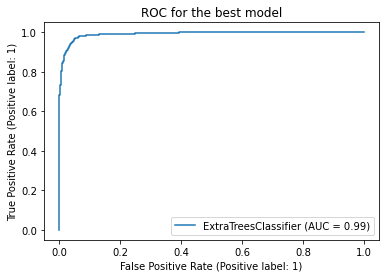

In [110]:
# Let's check the Auc for the best model after hyper parameter tuning
from sklearn.metrics import plot_roc_curve 
plot_roc_curve(rain_forecast_model, X_test, y_test)
plt.title("ROC for the best model")
plt.show()

# WE CAN SEE OUR PREDICTION FOR DATA IS 95.7 %

In [111]:
target_variable_prediction=pd.DataFrame([load_final_model.predict(X_test)[:],y_test[:]],index=["predicted","original"])

In [112]:
target_variable_prediction

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# AS YOU CAN SEE THE FEW DATA POINTS OUR MODEL PREDICTION AND ORIGINAL VALUES ARE COMING SAME IT MEANS WHAT WE ARE PREDICTING WE GETTING IT COORECT 95.7 % WHICH IS perfect

# NOW WE WILL BUILD OUR MODEL FOR ANOTHER TARGET VARIALE "RAINFALL" THIS IS REGRESSION MODEL

# NOW WE BUILD OUR REGRESSION MODEL USING "RAINFALL AS TARGET VARIABLE

# MODEL

In [74]:
rain_forecast_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,0,1,12,2008
1,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,0,2,12,2008
2,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,0,3,12,2008
3,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,0,4,12,2008
4,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,0,21,6,2017
8421,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,0,22,6,2017
8422,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,0,23,6,2017
8423,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,0,24,6,2017


In [75]:
# LET'A DROP OUR TARGET VARIBLE AND SEPARTE IT FRO X1 AND Y1
x1=rain_forecast_new.drop('Rainfall',axis=1)
y1=rain_forecast_new['Rainfall']

In [76]:
x1

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.900000,5.389395,7.632205,W,44.000000,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,0,1,12,2008
1,Albury,7.4,25.100000,5.389395,7.632205,WNW,44.000000,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,0,2,12,2008
2,Albury,12.9,25.700000,5.389395,7.632205,WSW,46.000000,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,0,3,12,2008
3,Albury,9.2,28.000000,5.389395,7.632205,NE,24.000000,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,0,4,12,2008
4,Albury,17.5,32.300000,5.389395,7.632205,W,41.000000,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,Uluru,2.8,23.400000,5.389395,7.632205,E,31.000000,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,0,21,6,2017
8421,Uluru,3.6,25.300000,5.389395,7.632205,NNW,22.000000,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,0,22,6,2017
8422,Uluru,5.4,26.900000,5.389395,7.632205,N,37.000000,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,0,23,6,2017
8423,Uluru,7.8,27.000000,5.389395,7.632205,SE,28.000000,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,0,24,6,2017


In [77]:
x1.shape

(7998, 24)

In [78]:
y1.shape

(7998,)

# ENCODING

In [79]:
# LET'S USE ENCODING TECHINQUE TO CONVERT CATEGORICAL DATA INTO NUMERICAL DATA 
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
categorical_col=["Location","WindGustDir","WindDir9am","WindDir3pm","RainToday"]
for columns in categorical_col:
    x1[columns]=LE.fit_transform(x1[columns])

In [80]:
x1

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.900000,5.389395,7.632205,13,44.000000,13,14,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.100000,5.389395,7.632205,14,44.000000,6,15,4.0,22.0,44.0,25.0,1010.6,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.700000,5.389395,7.632205,15,46.000000,13,15,19.0,26.0,38.0,30.0,1007.6,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.000000,5.389395,7.632205,4,24.000000,9,0,11.0,9.0,45.0,16.0,1017.6,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.300000,5.389395,7.632205,13,41.000000,1,7,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,5.389395,7.632205,0,31.000000,9,1,13.0,11.0,51.0,24.0,1024.6,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,6,2017
8421,9,3.6,25.300000,5.389395,7.632205,6,22.000000,9,3,13.0,9.0,56.0,21.0,1023.5,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,6,2017
8422,9,5.4,26.900000,5.389395,7.632205,3,37.000000,9,14,9.0,9.0,53.0,24.0,1021.0,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,6,2017
8423,9,7.8,27.000000,5.389395,7.632205,9,28.000000,10,3,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,6,2017


AS WE CAN SEE WE HAVE CONVERTED THE CATEGORICAL COLUNM TO NUMERICAL COLUMN TO BUIKLD MACHINE LEARNING MODEL

# LET'S USE STANDARD SCALRIZATION STANDARIZED OUR DATA

In [81]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x1=pd.DataFrame(scaler.fit_transform(x1),columns=x1.columns)

In [82]:
x1

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,-1.50700,0.055235,-0.148136,0.108158,-0.01436,1.229533,0.363630,1.251602,1.398774,0.711366,0.638189,0.187393,-1.617615,-1.686285,-1.397079,1.425965,0.013610,-0.140581,-0.100971,-0.541993,-0.543151,-1.671507,1.632568,-1.662253
1,-1.50700,-1.059453,0.217490,0.108158,-0.01436,1.442233,0.363630,-0.277157,1.625093,-0.988558,0.421563,-1.440755,-1.451582,-1.201596,-1.278962,0.012599,0.013610,-0.086858,0.326511,-0.541993,-0.543151,-1.557858,1.632568,-1.662253
2,-1.50700,-0.037656,0.317206,0.108158,-0.01436,1.654934,0.520125,1.251602,1.625093,0.605121,0.854814,-1.802566,-1.174862,-1.702998,-1.127098,0.012599,-1.076124,0.593634,0.138419,-0.541993,-0.543151,-1.444208,1.632568,-1.662253
3,-1.50700,-0.725046,0.699452,0.108158,-0.01436,-0.684776,-1.201314,0.378026,-1.769690,-0.244841,-0.986502,-1.380453,-1.949679,-0.031657,-0.435271,0.012599,0.013610,0.074311,0.702696,-0.541993,-0.543151,-1.330558,1.632568,-1.662253
4,-1.50700,0.816937,1.414085,0.108158,-0.01436,1.229533,0.128889,-1.369128,-0.185458,-0.669822,0.204938,0.850713,-1.008829,-1.168169,-1.582691,1.014310,1.535913,0.020588,1.249873,-0.541993,-0.543151,-1.216909,1.632568,-1.662253
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7993,1.02947,-1.914046,-0.065040,0.108158,-0.01436,-1.535579,-0.653583,0.378026,-1.543371,-0.032351,-0.769877,-1.018643,-1.506926,1.138282,0.830267,0.012599,0.013610,-1.358303,0.001624,-0.541993,-0.543151,0.601485,-0.124844,2.004688
7994,1.02947,-1.765421,0.250729,0.108158,-0.01436,-0.259374,-1.357809,0.378026,-1.090733,-0.032351,-0.986502,-0.717134,-1.672959,0.954434,0.627781,0.012599,0.013610,-1.215042,0.360710,-0.541993,-0.543151,0.715134,-0.124844,2.004688
7995,1.02947,-1.431015,0.516639,0.108158,-0.01436,-0.897477,-0.184100,0.378026,1.398774,-0.457332,-0.986502,-0.898039,-1.506926,0.536599,0.239682,0.012599,0.013610,-0.928519,0.634299,-0.541993,-0.543151,0.828784,-0.124844,2.004688
7996,1.02947,-0.985140,0.533258,0.108158,-0.01436,0.378729,-0.888325,0.596420,-1.090733,-0.032351,-1.203128,-1.018643,-1.506926,0.269184,0.189061,-0.632309,-1.076124,-0.462919,0.617199,-0.541993,-0.543151,0.942433,-0.124844,2.004688


AS WE CAN SEE THAT WE HAVE STANDARIZED OUR MODEL AND GIVEN EQUAL IMPORRANCE TO EVERY ELEMNT IN THE DATASET 

In [83]:
y1

0       0.6
1       0.0
2       0.0
3       0.0
4       1.0
       ... 
8420    0.0
8421    0.0
8422    0.0
8423    0.0
8424    0.0
Name: Rainfall, Length: 7998, dtype: float64

In [84]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x1,i) for i in range(x1.shape[1])]
vif_data["feature"]=x1.columns

In [85]:
vif_data

,VIF_value,feature
0,1.577934,Location
1,8.767067,MinTemp
2,26.442809,MaxTemp
3,1.547158,Evaporation
4,1.957854,Sunshine
5,1.618409,WindGustDir
6,2.395960,WindGustSpeed
7,1.350393,WindDir9am
8,1.484741,WindDir3pm
9,2.021193,WindSpeed9am


In [86]:
# Dropping Temp3pm column
x1.drop("Temp3pm",axis=1,inplace=True)

In [87]:
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x1,i) for i in range(x1.shape[1])]
vif_data["feature"]=x1.columns

In [88]:
vif_data

,VIF_value,feature
0,1.577408,Location
1,8.724213,MinTemp
2,9.694841,MaxTemp
3,1.546663,Evaporation
4,1.957818,Sunshine
5,1.614882,WindGustDir
6,2.384119,WindGustSpeed
7,1.349407,WindDir9am
8,1.483687,WindDir3pm
9,2.020700,WindSpeed9am


In [89]:
# NOW LET'S DROP COLUMN 9AM 
# Dropping Temp3pm column
x1.drop("Pressure9am",axis=1,inplace=True)

In [90]:
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x1,i) for i in range(x1.shape[1])]
vif_data["feature"]=x1.columns

In [91]:
vif_data

,VIF_value,feature
0,1.577318,Location
1,8.608687,MinTemp
2,9.304485,MaxTemp
3,1.529783,Evaporation
4,1.952511,Sunshine
5,1.600229,WindGustDir
6,2.361725,WindGustSpeed
7,1.328355,WindDir9am
8,1.414138,WindDir3pm
9,2.020239,WindSpeed9am


In [92]:
# let's drop temp9am 
x1.drop("Temp9am",axis=1,inplace=True)

In [93]:
vif_data=pd.DataFrame()
vif_data["VIF_value"]=[variance_inflation_factor(x1,i) for i in range(x1.shape[1])]
vif_data["feature"]=x1.columns

In [94]:
vif_data

,VIF_value,feature
0,1.574872,Location
1,4.496120,MinTemp
2,5.530891,MaxTemp
3,1.525816,Evaporation
4,1.945322,Sunshine
5,1.598524,WindGustDir
6,2.327142,WindGustSpeed
7,1.328350,WindDir9am
8,1.413798,WindDir3pm
9,1.994427,WindSpeed9am


AS WE CAN SEE THAT WE HAVE REMOVED THAT MULTICOLLINEARITY NOW PIR MODEL IS FOUND OKAYN

# LET'S BUILD OUR REGRESSION MODEL

In [95]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor as KNR
from sklearn.svm import SVR

# LINEAR REGRESSION

In [96]:
def select_best_random_state(x1, y1):
    best_random_state =0
    best_r2_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=random_state)
        LR = LinearRegression()
        LR.fit(X_train, y_train)
        y_pred = LR.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        if r2 > best_r2_score:
            best_r2_score = r2
            best_random_state = random_state

    return best_random_state, best_r2_score


best_random_state, best_r2_score= select_best_random_state(x1, y1)
print("Best Random State  :", best_random_state)
print("Best r2_score:- ",best_r2_score*100)

Best Random State  : 132
Best r2_score:-  53.58638474084471


In [97]:
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=193)
LR=LinearRegression()
LR.fit(X_train, y_train)
y_pred = LR.predict(X_test)
y_pred_train=LR.predict(X_train)
print("r2_score om training dataset",r2_score(y_train,y_pred_train)*100)
print("mean_squared_error",mean_squared_error(y_test,y_pred))
print("men absolute eroor",mean_absolute_error(y_test,y_pred))
print("mean_squared_error",np.sqrt(mean_squared_error(y_test,y_pred)))

r2_score om training dataset 48.87308482298101
mean_squared_error 10.148374491435483
men absolute eroor 1.4856912343327138
mean_squared_error 3.185651344927044


# RANDOM FOREST REGRESSOR

In [98]:
def select_best_random_state(x1, y1):
    best_random_state =0
    best_r2_score =0

    for random_state in range(1,100):
        X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=random_state)
        RFR=RandomForestRegressor()
        RFR.fit(X_train, y_train)
        y_pred = RFR.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        if r2 > best_r2_score:
            best_r2_score = r2
            best_random_state = random_state

    return best_random_state, best_r2_score


best_random_state, best_r2_score= select_best_random_state(x1, y1)
print("Best Random State  :", best_random_state)
print("Best r2_score:- ",best_r2_score*100)

Best Random State  : 17
Best r2_score:-  69.453939019189


In [99]:
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=17)
RFR=RandomForestRegressor()
RFR.fit(X_train, y_train)
y_pred = RFR.predict(X_test)
y_pred_train=RFR.predict(X_train)
print("r2_score om training dataset",r2_score(y_train,y_pred_train)*100)
print("mean_squared_error",mean_squared_error(y_test,y_pred))
print("men absolute eroor",mean_absolute_error(y_test,y_pred))
print("mean_squared_error",np.sqrt(mean_squared_error(y_test,y_pred)))

r2_score om training dataset 94.85462496124134
mean_squared_error 6.03014163375
men absolute eroor 0.88979875
mean_squared_error 2.455634670253293


# DESCION TREE REGRESSOR

In [100]:
def select_best_random_state(x1, y1):
    best_random_state =0
    best_r2_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=random_state)
        DTR=DecisionTreeRegressor()
        DTR.fit(X_train, y_train)
        y_pred = DTR.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        if r2 > best_r2_score:
            best_r2_score = r2
            best_random_state = random_state
            

    return best_random_state, best_r2_score


best_random_state, best_r2_score= select_best_random_state(x1, y1)
print("Best Random State  :", best_random_state)
print("Best r2_score:- ",best_r2_score*100)

Best Random State  : 17
Best r2_score:-  53.97958557383772


In [101]:
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=17)
DTR=DecisionTreeRegressor()
DTR.fit(X_train, y_train)
y_pred = DTR.predict(X_test)
y_pred_train=DTR.predict(X_train)
print("r2_score om training dataset",r2_score(y_train,y_pred_train)*100)
print("mean_squared_error",mean_squared_error(y_test,y_pred))
print("men absolute eroor",mean_absolute_error(y_test,y_pred))
print("mean_squared_error",np.sqrt(mean_squared_error(y_test,y_pred)))

r2_score om training dataset 100.0
mean_squared_error 8.51161875
men absolute eroor 0.8348124999999998
mean_squared_error 2.9174678661469438


# GRADIENT BOOSTING REGRESSOR

In [102]:
def select_best_random_state(x1, y1):
    best_random_state =0
    best_r2_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=random_state)
        GBR=GradientBoostingRegressor()
        GBR.fit(X_train, y_train)
        y_pred = GBR.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        if r2 > best_r2_score:
            best_r2_score = r2
            best_random_state = random_state

    return best_random_state, best_r2_score


best_random_state, best_r2_score= select_best_random_state(x1, y1)
print("Best Random State  :", best_random_state)
print("Best r2_score:- ",best_r2_score*100)

Best Random State  : 161
Best r2_score:-  59.807427145290944


In [103]:
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=161)
GBR=GradientBoostingRegressor()
GBR.fit(X_train, y_train)
y_pred = GBR.predict(X_test)
y_pred_train=GBR.predict(X_train)
print("r2_score om training dataset",r2_score(y_train,y_pred_train)*100)
print("mean_squared_error",mean_squared_error(y_test,y_pred))
print("men absolute eroor",mean_absolute_error(y_test,y_pred))
print("mean_squared_error",np.sqrt(mean_squared_error(y_test,y_pred)))

r2_score om training dataset 63.365023369296104
mean_squared_error 9.798226266563189
men absolute eroor 1.2540348177793257
mean_squared_error 3.1302118564984047


# EXTRA TREE REGRESSOR

In [104]:
def select_best_random_state(x1, y1):
    best_random_state =0
    best_r2_score =0

    for random_state in range(1,100):
        X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=random_state)
        ETR = ExtraTreesRegressor()
        ETR.fit(X_train, y_train)
        y_pred = ETR.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        if r2 > best_r2_score:
            best_r2_score = r2
            best_random_state = random_state

    return best_random_state, best_r2_score


best_random_state, best_r2_score= select_best_random_state(x1, y1)
print("Best Random State  :", best_random_state)
print("Best r2_score:- ",best_r2_score*100)

Best Random State  : 55
Best r2_score:-  71.20473111013443


In [105]:
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=55)
ETR=ExtraTreesRegressor()
ETR.fit(X_train, y_train)
y_pred = ETR.predict(X_test)
y_pred_train=ETR.predict(X_train)
print("r2_score om training dataset",r2_score(y_train,y_pred_train)*100)
print("mean_squared_error",mean_squared_error(y_test,y_pred))
print("men absolute eroor",mean_absolute_error(y_test,y_pred))
print("mean_squared_error",np.sqrt(mean_squared_error(y_test,y_pred)))

r2_score om training dataset 100.0
mean_squared_error 6.564494626249999
men absolute eroor 0.8473675000000006
mean_squared_error 2.5621269730928637


# KNEIGHBOURS REGRESSOR

In [96]:
def select_best_random_state(x1, y1):
    best_random_state =0
    best_r2_score =0

    for random_state in range(1,200):
        X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=random_state)
        knn = KNR()
        knn.fit(X_train, y_train)
        y_pred = knn.predict(X_test)
        r2 = r2_score(y_test, y_pred)
        if r2 > best_r2_score:
            best_r2_score = r2
            best_random_state = random_state

    return best_random_state, best_r2_score


best_random_state, best_r2_score= select_best_random_state(x1, y1)
print("Best Random State  :", best_random_state)
print("Best r2_score:- ",best_r2_score*100)

Best Random State  : 161
Best r2_score:-  55.60224080527368


In [106]:
X_train, X_test, y_train, y_test = train_test_split(x1, y1, test_size=0.2, random_state=161)
knn=KNR()
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
y_pred_train=knn.predict(X_train)
print("r2_score om training dataset",r2_score(y_train,y_pred_train)*100)
print("mean_squared_error",mean_squared_error(y_test,y_pred))
print("men absolute eroor",mean_absolute_error(y_test,y_pred))
print("mean_squared_error",np.sqrt(mean_squared_error(y_test,y_pred)))

r2_score om training dataset 64.82578974358007
mean_squared_error 11.091526250000001
men absolute eroor 1.2507375
mean_squared_error 3.3303943084866092


# Now after doing all this we will do cross validation to test that our model overfitting or not

In [107]:
from sklearn.model_selection import cross_val_score

In [108]:
cvr=cross_val_score(LR,x,y,cv=5)
print(cvr)
print(cvr.mean())
print("differencve of r2_score and cross_val_score",(r2_score(y_pred,y_test)-cvr.mean())*100)

[-0.21675619 -0.56249017  0.08705764 -0.0420671   0.        ]
-0.14685116309436858
differencve of r2_score and cross_val_score 27.112457962833474


In [109]:
cvr=cross_val_score(RFR,x,y,cv=5)
print(cvr)
print(cvr.mean())
print("differencve of r2_score and cross_val_score",(r2_score(y_pred,y_test)-cvr.mean())*100)

[-0.88667608 -0.94577567  0.26864657  0.67222015  0.        ]
-0.1783170057826972
differencve of r2_score and cross_val_score 30.25904223166634


In [110]:
cvr=cross_val_score(GBR,x,y,cv=5)
print(cvr)
print(cvr.mean())
print("differencve of r2_score and cross_val_score",(r2_score(y_pred,y_test)-cvr.mean())*100)

[-0.51464433 -0.93032607  0.1000163   0.42482002  0.        ]
-0.18402681602829557
differencve of r2_score and cross_val_score 30.830023256226173


In [111]:
cvr=cross_val_score(DTR,x,y,cv=5)
print(cvr)
print(cvr.mean())
print("differencve of r2_score and cross_val_score",(r2_score(y_pred,y_test)-cvr.mean())*100)

[-1.56633188 -1.48258396 -0.235       0.2178305   0.        ]
-0.6132170682795968
differencve of r2_score and cross_val_score 73.7490484813563


In [112]:
cvr=cross_val_score(knn,x,y,cv=5)
print(cvr)
print(cvr.mean())
print("differencve of r2_score and cross_val_score",(r2_score(y_pred,y_test)-cvr.mean())*100)

[-1.61942217 -1.08399251 -0.31508788  0.6200186   0.        ]
-0.47969678991438436
differencve of r2_score and cross_val_score 60.39702064483505


In [113]:
cvr=cross_val_score(ETR,x,y,cv=5)
print(cvr)
print(cvr.mean())
print("differencve of r2_score and cross_val_score",(r2_score(y_pred,y_test)-cvr.mean())*100)

[-0.85351523 -0.88109607  0.47328115  0.73473424  0.        ]
-0.1053191783377287
differencve of r2_score and cross_val_score 22.959259487169486


# HERE IAM CHOOSING THE EXTRA TREE  REGRESOR AS MY BEST MODEL BECAUSE IF CHECK THE DIFFERENCE BETWEEN THE R2 SCORE AND CROSS VALIDATION IT IS LEAST SO I DECIDED TO CHOOSE THE

# LET'S DO HYPERPARAMETER TUNNING

In [114]:
from sklearn.model_selection import GridSearchCV

In [107]:
params= {
    'n_estimators': [100,150],  # List of values to try for n_estimators
    'max_features': ['sqrt','log2'],
    'max_depth': [2,3,],
    'min_samples_split': [2,3,],
    'min_samples_leaf': [1,2],
    'criterion': ['squared_error','absolute_error']
}

In [108]:
GSCV=GridSearchCV(ExtraTreesRegressor(),params,cv=5)

In [109]:
GSCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [2, 3], 'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 3],
                         'n_estimators': [100, 150]})

In [110]:
GSCV.best_params_

{'criterion': 'squared_error',
 'max_depth': 3,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 3,
 'n_estimators': 150}

In [174]:
rainforecast_model=ExtraTreesRegressor(n_estimators=150,max_depth=20,min_samples_leaf=1,criterion="squared_error",max_features='log2',min_samples_split=3)

In [175]:
rainforecast_model.fit(X_train,y_train)

ExtraTreesRegressor(max_depth=20, max_features='log2', min_samples_split=3,
                    n_estimators=150)

In [176]:
pred=rainforecast_model.predict(X_test)

In [177]:
print("r2_score",r2_score(y_test,pred))
print("mean_squared_error",mean_squared_error(y_test,pred))
print("mean_absolute_error",mean_absolute_error(y_test,pred))
print("root_mean_squared_error",np.sqrt(mean_squared_error(y_test,pred)))

r2_score 0.7079102563013089
mean_squared_error 7.124673144838593
mean_absolute_error 0.9280294314762605
root_mean_squared_error 2.6692083367243167


In [178]:
import pickle
project_name="rainfall.pkl"
pickle.dump(rainforecast_model,open(project_name,'wb'))

In [179]:
import pickle
load_final_model=pickle.load(open('rainfall.pkl','rb'))
final_result=load_final_model.score(X_test,y_test)
print(final_result*100)

70.79102563013089


In [180]:
target_variable_prediction=pd.DataFrame([load_final_model.predict(X_test)[:],y_test[:]],index=["predicted","original"])

In [181]:
target_variable_prediction

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

# OUR FINAL MODEL IS BUILD AND SCORE WAS ALMOST 70% ACCURATE WE CAN ASLO SEE THAT IT IS VERY GOOD MODEL AS BECAUSE WE CAN SEE THE TREND ALSO THAT PREDICTED RAINFALL IS ALMOST CLOSE TO ACTUAL VALUE WAS SO OUR FINAL MODEL IS PERFECT WITH ACCURACY SCORE 70%

 # FOR RAIN_TOMORROW WE HAVE PREDICTION OF :- 95.7% 
 # FOR RAINFALL WE HVA PREDICTOPN OF :-71%